# Improving the reliability of data storage systems project[1]

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, explained_variance_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

file_path = 'project1_dataset.xlsx'
df = pd.read_excel(file_path)
df = df.sample(frac=1.0, random_state=42).reset_index(drop=True)


column_mapping = {
    'r_5': 'r_5: Reallocated Sector Count',
    'n_5': 'n_5: Reallocated Sector Count',
    'r_183': 'r_183: SATA Downshift Error',
    'n_183': 'n_183: SATA Downshift Error',
    'r_184': 'r_184: End-to-End Errors',
    'n_184': 'n_184: End-to-End Errors',
    'r_187': 'r_187: Reported Uncorrectable Errors',
    'n_187': 'n_187: Reported Uncorrectable Errors',
    'r_195': 'r_195: Hardware ECC Recovered',
    'n_195': 'n_195: Hardware ECC Recovered',
    'r_197': 'r_197: Current Pending Sector Count',
    'n_197': 'n_197: Current Pending Sector Count',
    'r_199': 'r_199: Ultra DMA CRC Error Count',
    'n_199': 'n_199: Ultra DMA CRC Error Count',
    'r_171': 'r_171: Program Failed Count',
    'n_171': 'n_171: Program Failed Count',
    'r_172': 'r_172: Erase Failed Count',
    'n_172': 'n_172: Erase Failed Count',
    'n_170': 'n_170: Available Reserved Blocks',
    'n_233': 'n_233: Media Wearout Indicator',
    'r_241': 'r_241: Number of Blocks Written',
    'n_241': 'n_241: Number of Blocks Written',
    'r_242': 'r_242: Number of Blocks Read',
    'n_242': 'n_242: Number of Blocks Read',
    'r_9': 'r_9: Power on Hours',
    'n_9': 'n_9: Power on Hours',
    'r_12': 'r_12: Power Cycle Count',
    'n_12': 'n_12: Power Cycle Count',
    'r_174': 'r_174: Unexpected Power Loss Count',
    'n_174': 'n_174: Unexpected Power Loss Count',
    'failure': 'failure'
}
df.rename(columns=column_mapping, inplace=True)


In [4]:
df.head()

,r_5: Reallocated Sector Count,n_5: Reallocated Sector Count,r_183: SATA Downshift Error,n_183: SATA Downshift Error,r_184: End-to-End Errors,n_184: End-to-End Errors,r_187: Reported Uncorrectable Errors,n_187: Reported Uncorrectable Errors,r_195: Hardware ECC Recovered,n_195: Hardware ECC Recovered,...,n_241: Number of Blocks Written,r_242: Number of Blocks Read,n_242: Number of Blocks Read,r_9: Power on Hours,n_9: Power on Hours,r_12: Power Cycle Count,n_12: Power Cycle Count,r_174: Unexpected Power Loss Count,n_174: Unexpected Power Loss Count,failure
0,0.0,100.0,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.674183,71.785470,...,100.000000,1.995498e-05,100.000000,0.332267,100.000000,0.011169,100.000000,0.020628,100,1
1,0.0,100.0,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,49.748744,...,94.913689,4.955898e-01,97.383575,0.219737,100.000000,0.013961,100.000000,0.027503,100,0
2,0.0,100.0,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,...,85.714286,4.955898e-01,97.383575,0.604700,91.919192,0.007818,98.989899,0.031625,100,0
3,0.0,96.0,0.001083,99.979577,0.000224,99.996411,0.000707,99.999279,0.674183,71.785470,...,94.913689,4.955898e-01,97.383575,0.752542,100.000000,0.018285,99.753151,0.031625,100,0
4,0.0,100.0,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.674183,71.785470,...,100.000000,2.128525e-07,100.000000,0.714754,100.000000,0.006143,100.000000,0.006876,100,0


In [5]:
print("Shape of Data:")
print(df.shape)
print("\nColumns names:")
print(df.columns)
print("\nEach column data type:")
print(df.dtypes)

Shape of Data:
(4999, 31)

Columns names:
Index(['r_5: Reallocated Sector Count', 'n_5: Reallocated Sector Count',
       'r_183: SATA Downshift Error', 'n_183: SATA Downshift Error',
       'r_184: End-to-End Errors', 'n_184: End-to-End Errors',
       'r_187: Reported Uncorrectable Errors',
       'n_187: Reported Uncorrectable Errors', 'r_195: Hardware ECC Recovered',
       'n_195: Hardware ECC Recovered', 'r_197: Current Pending Sector Count',
       'n_197: Current Pending Sector Count',
       'r_199: Ultra DMA CRC Error Count', 'n_199: Ultra DMA CRC Error Count',
       'r_171: Program Failed Count', 'n_171: Program Failed Count',
       'r_172: Erase Failed Count', 'n_172: Erase Failed Count',
       'n_170: Available Reserved Blocks', 'n_233: Media Wearout Indicator',
       'r_241: Number of Blocks Written', 'n_241: Number of Blocks Written',
       'r_242: Number of Blocks Read', 'n_242: Number of Blocks Read',
       'r_9: Power on Hours', 'n_9: Power on Hours', 'r_12: Pow

In [6]:
df = df.astype('float64', errors='ignore')
print(df.dtypes)

r_5: Reallocated Sector Count           float64
n_5: Reallocated Sector Count           float64
r_183: SATA Downshift Error             float64
n_183: SATA Downshift Error             float64
r_184: End-to-End Errors                float64
n_184: End-to-End Errors                float64
r_187: Reported Uncorrectable Errors    float64
n_187: Reported Uncorrectable Errors    float64
r_195: Hardware ECC Recovered           float64
n_195: Hardware ECC Recovered           float64
r_197: Current Pending Sector Count     float64
n_197: Current Pending Sector Count     float64
r_199: Ultra DMA CRC Error Count        float64
n_199: Ultra DMA CRC Error Count        float64
r_171: Program Failed Count             float64
n_171: Program Failed Count             float64
r_172: Erase Failed Count               float64
n_172: Erase Failed Count               float64
n_170: Available Reserved Blocks        float64
n_233: Media Wearout Indicator          float64
r_241: Number of Blocks Written         

In [7]:
df['failure'].value_counts()

failure
0.0    3999
1.0    1000
Name: count, dtype: int64

In [8]:
df.describe() 

,r_5: Reallocated Sector Count,n_5: Reallocated Sector Count,r_183: SATA Downshift Error,n_183: SATA Downshift Error,r_184: End-to-End Errors,n_184: End-to-End Errors,r_187: Reported Uncorrectable Errors,n_187: Reported Uncorrectable Errors,r_195: Hardware ECC Recovered,n_195: Hardware ECC Recovered,...,n_241: Number of Blocks Written,r_242: Number of Blocks Read,n_242: Number of Blocks Read,r_9: Power on Hours,n_9: Power on Hours,r_12: Power Cycle Count,n_12: Power Cycle Count,r_174: Unexpected Power Loss Count,n_174: Unexpected Power Loss Count,failure
count,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,...,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.000000,4999.0,4999.00000
mean,0.173383,99.526963,0.001189,99.852729,0.000008,99.992858,0.000910,99.995945,1.021716,76.804769,...,92.648612,0.702078,95.840262,0.434214,97.706830,0.017398,99.588058,0.032125,100.0,0.20004
std,1.962036,2.792436,0.022691,1.825500,0.000133,0.252677,0.032281,0.080722,5.301764,20.800966,...,6.269554,1.373174,4.789325,0.201771,3.053807,0.090940,0.502592,0.151743,0.0,0.40007
min,0.000000,0.000000,0.000000,0.000000,0.000000,83.838384,0.000000,95.959596,0.000000,0.000000,...,57.142857,0.000000,75.000000,0.000145,90.909091,0.000558,95.959596,0.000000,100.0,0.00000
25%,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,49.748744,...,85.714286,0.000039,97.383575,0.287339,93.939394,0.008377,98.989899,0.017190,100.0,0.00000
50%,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,71.785470,...,94.913689,0.495590,97.383575,0.469722,100.000000,0.011169,100.000000,0.031625,100.0,0.00000
75%,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.000000,100.000000,0.674183,100.000000,...,100.000000,0.495590,100.000000,0.602151,100.000000,0.015637,100.000000,0.031625,100.0,0.00000
max,47.977070,100.000000,0.797978,100.000000,0.008293,100.000000,1.863683,100.000000,91.747675,100.000000,...,100.000000,23.548387,100.000000,0.891171,100.000000,2.892804,100.000000,5.933854,100.0,1.00000


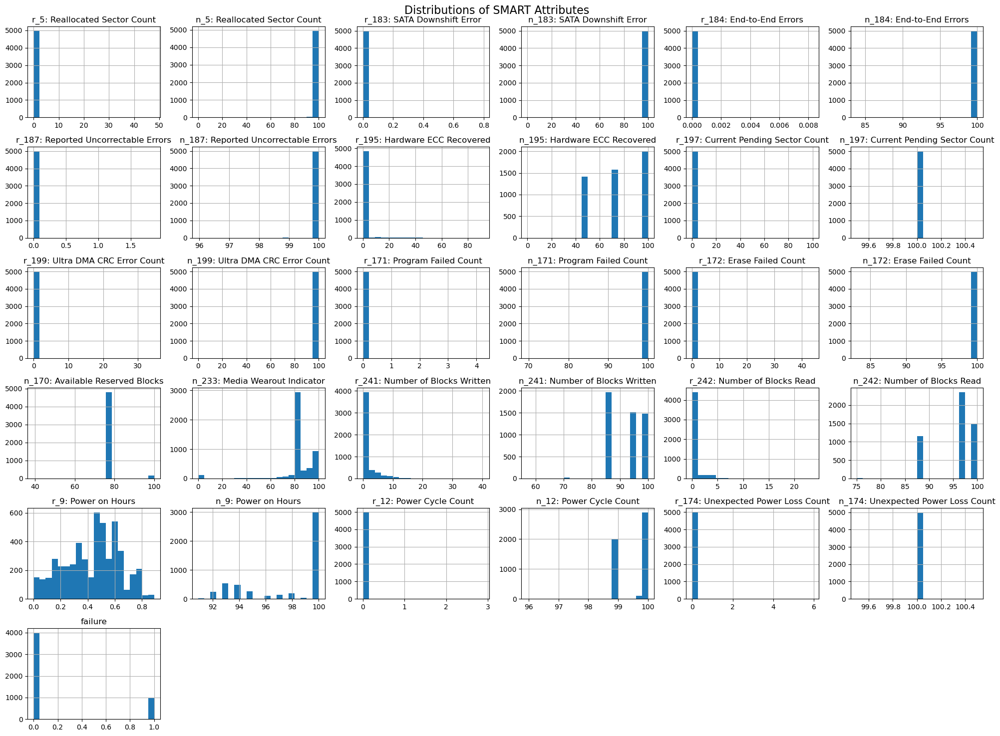

In [9]:
df.hist(bins=20, figsize=(20, 15), layout=(6, 6))
plt.suptitle("Distributions of SMART Attributes", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()

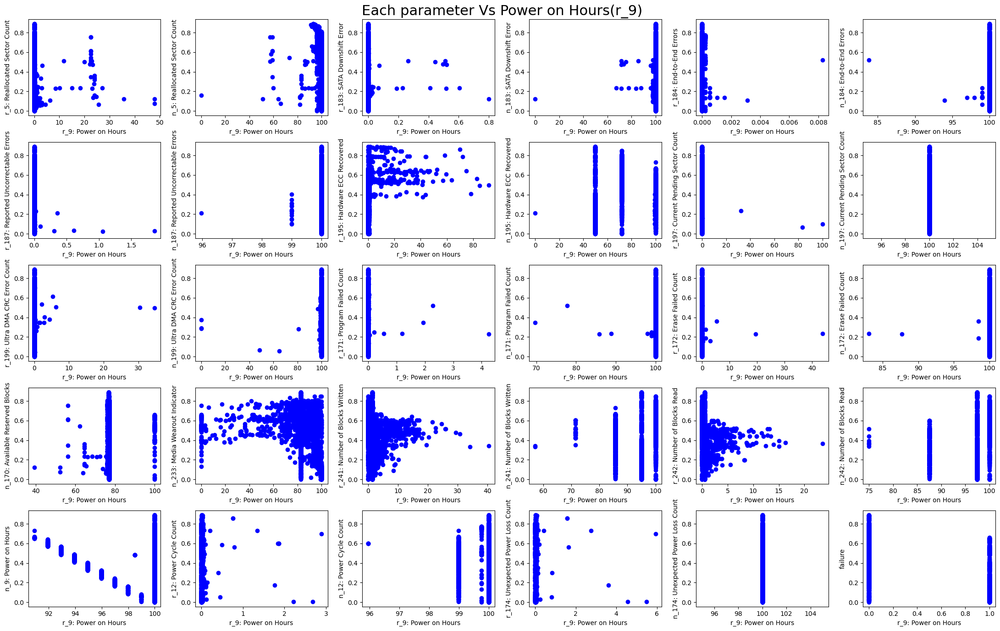

In [10]:
fig, axs = plt.subplots(5, 6, figsize=(22, 14))

columns = df.columns.drop('r_9: Power on Hours')
row, col = 0, 0

for column in columns:
    if col == 6:
        col = 0
        row += 1
    axs[row, col].scatter(df[column], df['r_9: Power on Hours'], color="blue")
    axs[row, col].set_ylabel(column)
    axs[row, col].set_xlabel('r_9: Power on Hours')
    col += 1

fig.suptitle("Each parameter Vs Power on Hours(r_9)", fontsize=22)

plt.tight_layout()
plt.show()

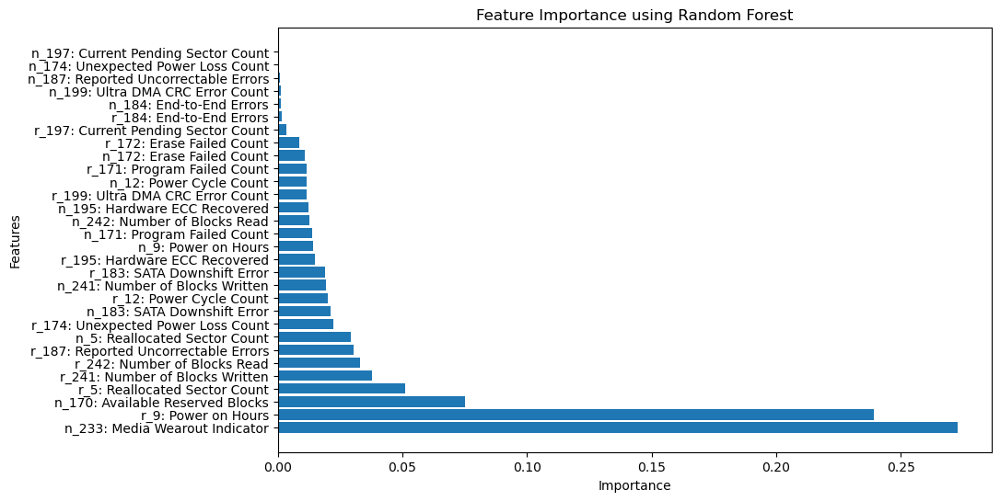

n_233: Media Wearout Indicator: 0.2728
r_9: Power on Hours: 0.2390
n_170: Available Reserved Blocks: 0.0752
r_5: Reallocated Sector Count: 0.0509
r_241: Number of Blocks Written: 0.0379
r_242: Number of Blocks Read: 0.0330
r_187: Reported Uncorrectable Errors: 0.0305
n_5: Reallocated Sector Count: 0.0293
r_174: Unexpected Power Loss Count: 0.0222
n_183: SATA Downshift Error: 0.0213
r_12: Power Cycle Count: 0.0200
n_241: Number of Blocks Written: 0.0194
r_183: SATA Downshift Error: 0.0188
r_195: Hardware ECC Recovered: 0.0149
n_9: Power on Hours: 0.0140
n_171: Program Failed Count: 0.0137
n_242: Number of Blocks Read: 0.0127
n_195: Hardware ECC Recovered: 0.0123
r_199: Ultra DMA CRC Error Count: 0.0115
n_12: Power Cycle Count: 0.0115
r_171: Program Failed Count: 0.0115
n_172: Erase Failed Count: 0.0107
r_172: Erase Failed Count: 0.0088
r_197: Current Pending Sector Count: 0.0035
r_184: End-to-End Errors: 0.0016
n_184: End-to-End Errors: 0.0011
n_199: Ultra DMA CRC Error Count: 0.0011
n_

In [11]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np

X = df.drop(columns=['failure'])
y = df['failure']

rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X, y)

feature_importances = rf_model.feature_importances_

features = X.columns
sorted_indices = np.argsort(feature_importances)[::-1]
plt.figure(figsize=(10, 6))
plt.title("Feature Importance using Random Forest")
plt.barh(range(len(sorted_indices)), feature_importances[sorted_indices], align="center")
plt.yticks(range(len(sorted_indices)), features[sorted_indices])
plt.xlabel("Importance")
plt.ylabel("Features")
plt.show()

for feature, importance in zip(features[sorted_indices], feature_importances[sorted_indices]):
    print(f"{feature}: {importance:.4f}")


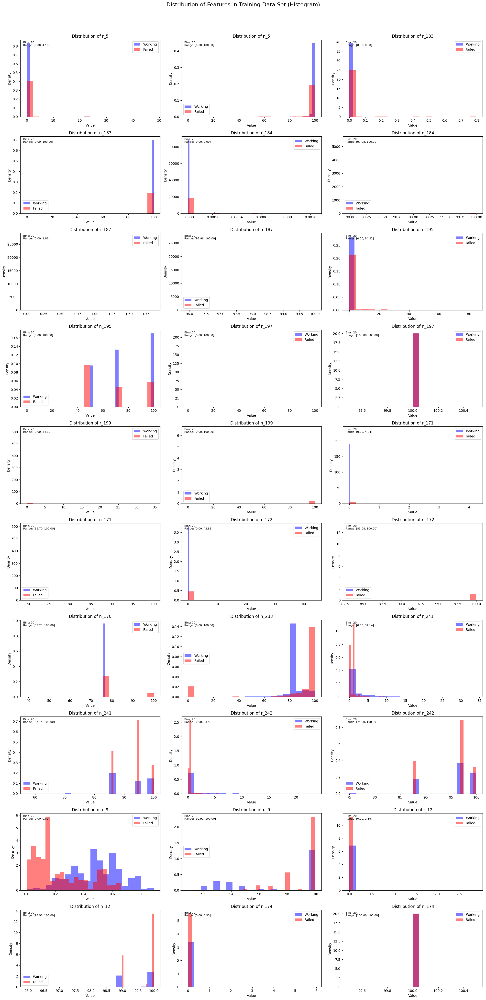

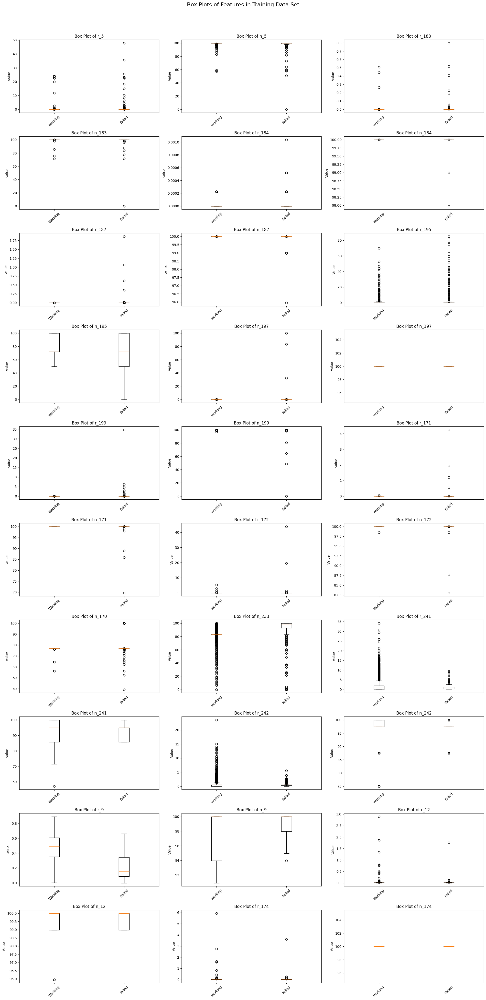


Summary Statistics for Training Data:

Working Drives:
               r_5          n_5        r_183        n_183        r_184  \
count  3199.000000  3199.000000  3199.000000  3199.000000  3199.000000   
mean      0.086811    99.725539     0.000441    99.975987     0.000004   
std       1.361832     1.840159     0.012841     0.714120     0.000029   
min       0.000000    57.000000     0.000000    71.428571     0.000000   
25%       0.000000   100.000000     0.000000   100.000000     0.000000   
50%       0.000000   100.000000     0.000000   100.000000     0.000000   
75%       0.000000   100.000000     0.000000   100.000000     0.000000   
max      23.988535   100.000000     0.509820   100.000000     0.000224   

             n_184        r_187        n_187        r_195        n_195  ...  \
count  3199.000000  3199.000000  3199.000000  3199.000000  3199.000000  ...   
mean     99.999939     0.000012    99.999988     0.565262    78.502608  ...   
std       0.000462     0.000091     0.00

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

df = pd.read_excel('project1_dataset.xlsx')

X = df.drop('failure', axis=1)
y = df['failure']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=y
)

n_features = len(X_train.columns)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols

plt.figure(figsize=(20, 4*n_rows))
plt.suptitle('Distribution of Features in Training Data Set (Histogram)', fontsize=16, y=1.02)

for idx, column in enumerate(X_train.columns, 1):
    plt.subplot(n_rows, n_cols, idx)
    working_data = X_train[column][y_train == 0]
    failed_data = X_train[column][y_train == 1]
    all_data = np.concatenate([working_data, failed_data])
    data_min = np.min(all_data)
    data_max = np.max(all_data)
    data_range = data_max - data_min
    n_bins = max(20, int(np.ceil(np.log2(len(all_data)) + 1)))
    plt.hist(working_data, 
             bins=n_bins,
             alpha=0.5,
             label='Working',
             color='blue',
             density=True)
    plt.hist(failed_data, 
             bins=n_bins,
             alpha=0.5,
             label='Failed',
             color='red',
             density=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.legend()
    plt.text(0.02, 0.98, 
             f'Bins: {n_bins}\nRange: [{data_min:.2f}, {data_max:.2f}]',
             transform=plt.gca().transAxes,
             verticalalignment='top',
             fontsize=8)

plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 4*n_rows))
plt.suptitle('Box Plots of Features in Training Data Set', fontsize=16, y=1.02)

for idx, column in enumerate(X_train.columns, 1):
    plt.subplot(n_rows, n_cols, idx)
    data = [
        X_train[column][y_train == 0],
        X_train[column][y_train == 1]
    ]
    plt.boxplot(data, labels=['Working', 'Failed'])
    plt.title(f'Box Plot of {column}')
    plt.ylabel('Value')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

print("\nSummary Statistics for Training Data:")
print("\nWorking Drives:")
print(X_train[y_train == 0].describe())
print("\nFailed Drives:")
print(X_train[y_train == 1].describe())

print("\nDistribution Separation Analysis:")
print("\nColumn | KS-Statistic | p-value | Data Range")
print("-" * 60)

from scipy import stats
for column in X_train.columns:
    ks_stat, p_value = stats.ks_2samp(
        X_train[column][y_train == 0],
        X_train[column][y_train == 1]
    )
    data_range = X_train[column].max() - X_train[column].min()
    print(f"{column:15} | {ks_stat:.4f} | {p_value:.4e} | {data_range:.4f}")

plt.figure(1).savefig('histogram_plots.png')
plt.figure(2).savefig('box_plots.png')
print("\nFigures have been saved as 'histogram_plots.png' and 'box_plots.png'")

## Part1

### baselines models:

In [12]:
failed_disks = df[df['failure'] == 1]

features = [col for col in failed_disks.columns if col not in ['r_9: Power on Hours', 
                                                              'n_9: Power on Hours', 
                                                              'failure']]
X = failed_disks[features]
y = failed_disks['r_9: Power on Hours']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


threshold = 0.5
y_train_classes = np.where(y_train > threshold, 1, 0)

# Now apply SMOTE
smote = SMOTE(random_state=42)
X_train_re, y_train_re = smote.fit_resample(X_train, y_train_classes)



scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [13]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)

y_pred_train = model.predict(X_train_scaled)
y_pred_test = model.predict(X_test_scaled)

metrics = {
    'R2 Score (Train)': r2_score(y_train, y_pred_train),
    'R2 Score (Test)': r2_score(y_test, y_pred_test),
    'RMSE (Train)': np.sqrt(mean_squared_error(y_train, y_pred_train)),
    'RMSE (Test)': np.sqrt(mean_squared_error(y_test, y_pred_test)),
    'MAE (Train)': mean_absolute_error(y_train, y_pred_train),
    'MAE (Test)': mean_absolute_error(y_test, y_pred_test),
    'Explained Variance Score (Train)': explained_variance_score(y_train, y_pred_train),
    'Explained Variance Score (Test)': explained_variance_score(y_test, y_pred_test)
}

print("Model Performance Metrics:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

Model Performance Metrics:
R2 Score (Train): 0.7325
R2 Score (Test): -41910392858873000552824832.0000
RMSE (Train): 0.0935
RMSE (Test): 1247289347702.2026
MAE (Train): 0.0616
MAE (Test): 88196675586.2644
Explained Variance Score (Train): 0.7325
Explained Variance Score (Test): -41700840894578625714585600.0000



Top 10 Most Important Features:
                                 feature    importance
25               n_12: Power Cycle Count  7.281853e+12
21       n_241: Number of Blocks Written  4.064205e+12
9          n_195: Hardware ECC Recovered  3.822263e+12
11   n_197: Current Pending Sector Count  8.826716e+11
7   n_187: Reported Uncorrectable Errors  1.186103e+10
4               r_184: End-to-End Errors  4.292959e+09
5               n_184: End-to-End Errors  4.265686e+09
26    r_174: Unexpected Power Loss Count  1.481123e-01
24               r_12: Power Cycle Count  1.394530e-01
18      n_170: Available Reserved Blocks  1.190840e-01


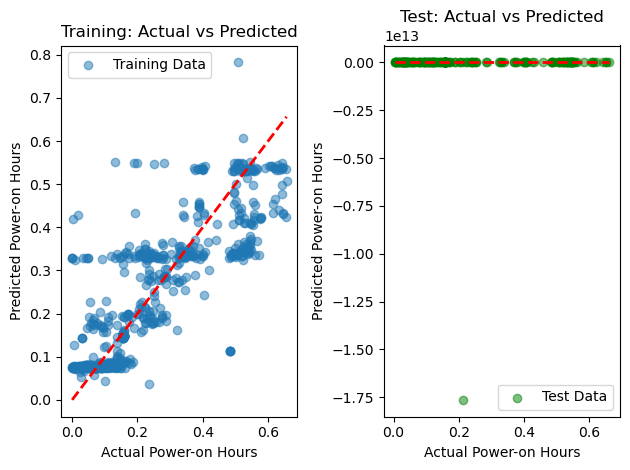

In [15]:
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': abs(model.coef_)
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nTop 10 Most Important Features:")
print(feature_importance.head(10))

plt.subplot(1, 2, 1)
plt.scatter(y_train, y_pred_train, alpha=0.5, label='Training Data')
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Training: Actual vs Predicted')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_test, alpha=0.5, color='green', label='Test Data')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Test: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()


In [16]:
from sklearn.feature_selection import SelectKBest, f_regression

selector = SelectKBest(score_func=f_regression, k=10)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

model_selected = LinearRegression()
model_selected.fit(X_train_selected, y_train)

y_pred_train_selected = model_selected.predict(X_train_selected)
y_pred_test_selected = model_selected.predict(X_test_selected)

Model Performance Metrics:
R2 Score (Train): 0.7089
R2 Score (Test): 0.6744
RMSE (Train): 0.0975
RMSE (Test): 0.1099
MAE (Train): 0.0644
MAE (Test): 0.0708
Explained Variance Score (Train): 0.7089
Explained Variance Score (Test): 0.6746


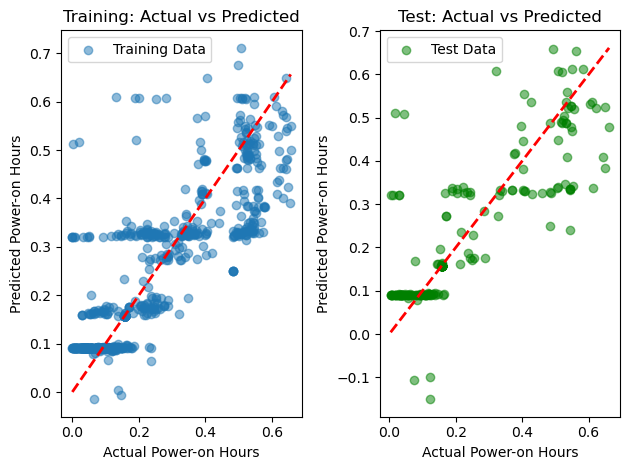

In [17]:
metrics = {
    'R2 Score (Train)': r2_score(y_train, y_pred_train_selected),
    'R2 Score (Test)': r2_score(y_test, y_pred_test_selected),
    'RMSE (Train)': np.sqrt(mean_squared_error(y_train, y_pred_train_selected)),
    'RMSE (Test)': np.sqrt(mean_squared_error(y_test, y_pred_test_selected)),
    'MAE (Train)': mean_absolute_error(y_train, y_pred_train_selected),
    'MAE (Test)': mean_absolute_error(y_test, y_pred_test_selected),
    'Explained Variance Score (Train)': explained_variance_score(y_train, y_pred_train_selected),
    'Explained Variance Score (Test)': explained_variance_score(y_test, y_pred_test_selected)
}

print("Model Performance Metrics:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")


plt.subplot(1, 2, 1)
plt.scatter(y_train, y_pred_train_selected, alpha=0.5, label='Training Data')
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Training: Actual vs Predicted')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_test_selected, alpha=0.5, color='green', label='Test Data')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Test: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

RandomForestRegressor Model Performance Metrics:
R2 Score (Train): 0.9646
R2 Score (Test): 0.9129
RMSE (Train): 0.0340
RMSE (Test): 0.0569
MAE (Train): 0.0185
MAE (Test): 0.0367
Explained Variance Score (Train): 0.9646
Explained Variance Score (Test): 0.9132

Top 10 Most Important Features:
                                feature  importance
19       n_233: Media Wearout Indicator    0.568353
8         r_195: Hardware ECC Recovered    0.164022
9         n_195: Hardware ECC Recovered    0.052065
22         r_242: Number of Blocks Read    0.041944
20      r_241: Number of Blocks Written    0.035839
24              r_12: Power Cycle Count    0.026849
26   r_174: Unexpected Power Loss Count    0.023501
2           r_183: SATA Downshift Error    0.020760
1         n_5: Reallocated Sector Count    0.016856
10  r_197: Current Pending Sector Count    0.011084


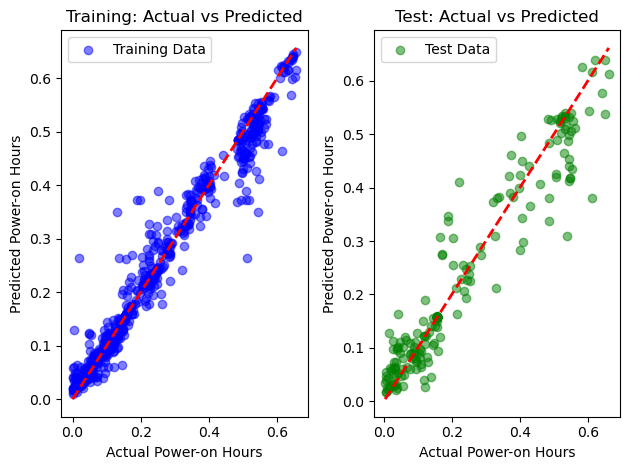

In [19]:
# Random Forest
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)
rf_train_accuracy = rf_model.score(X_train_scaled, y_train) * 100
rf_test_accuracy = rf_model.score(X_test_scaled, y_test) * 100


y_pred_train_rf = rf_model.predict(X_train_scaled)
y_pred_test_rf = rf_model.predict(X_test_scaled)

metrics_rf = {
    'R2 Score (Train)': r2_score(y_train, y_pred_train_rf),
    'R2 Score (Test)': r2_score(y_test, y_pred_test_rf),
    'RMSE (Train)': np.sqrt(mean_squared_error(y_train, y_pred_train_rf)),
    'RMSE (Test)': np.sqrt(mean_squared_error(y_test, y_pred_test_rf)),
    'MAE (Train)': mean_absolute_error(y_train, y_pred_train_rf),
    'MAE (Test)': mean_absolute_error(y_test, y_pred_test_rf),
    'Explained Variance Score (Train)': explained_variance_score(y_train, y_pred_train_rf),
    'Explained Variance Score (Test)': explained_variance_score(y_test, y_pred_test_rf)
}

print("RandomForestRegressor Model Performance Metrics:")
for metric, value in metrics_rf.items():
    print(f"{metric}: {value:.4f}")


feature_importance_rf = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
})
feature_importance_rf = feature_importance_rf.sort_values('importance', ascending=False)

print("\nTop 10 Most Important Features:")
print(feature_importance_rf.head(10))


plt.subplot(1, 2, 1)
plt.scatter(y_train, y_pred_train_rf, alpha=0.5, label='Training Data', color='blue')
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Training: Actual vs Predicted')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_test_rf, alpha=0.5, color='green', label='Test Data')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Test: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()


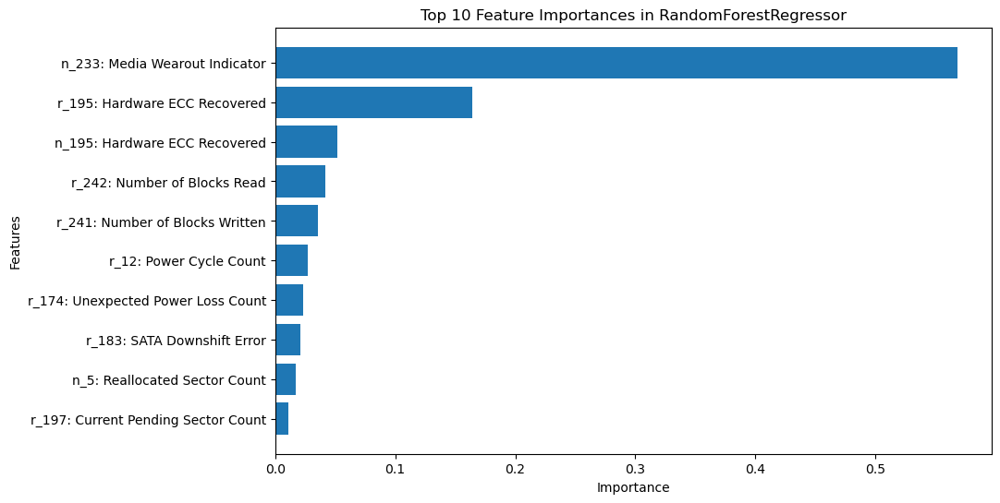

In [20]:
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_rf['feature'].head(10), feature_importance_rf['importance'].head(10))
plt.gca().invert_yaxis()
plt.title('Top 10 Feature Importances in RandomForestRegressor')
plt.xlabel('Importance')
plt.ylabel('Features')
plt.show()

RandomForestRegressor Model Performance Metrics:
R2 Score (Train): 0.7966
R2 Score (Test): 0.7609
RMSE (Train): 0.0815
RMSE (Test): 0.0942
MAE (Train): 0.0574
MAE (Test): 0.0652
Explained Variance Score (Train): 0.7992
Explained Variance Score (Test): 0.7653


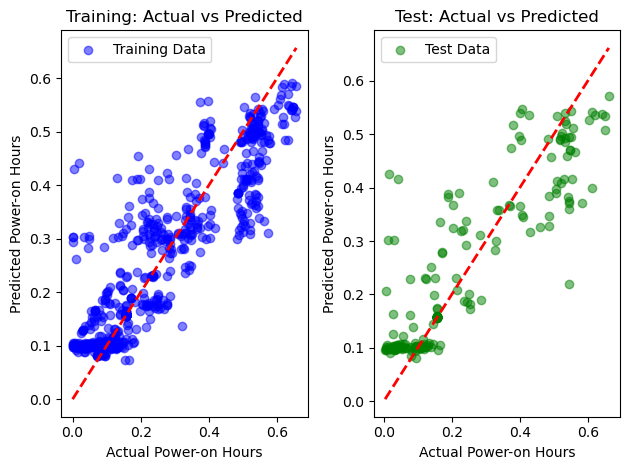

In [21]:
# SVR
from sklearn.svm import SVR

svr_model = SVR(kernel='rbf')
svr_model.fit(X_train_scaled, y_train)
svr_train_accuracy = svr_model.score(X_train_scaled, y_train) * 100
svr_test_accuracy = svr_model.score(X_test_scaled, y_test) * 100


y_pred_train_svr = svr_model.predict(X_train_scaled)
y_pred_test_svr = svr_model.predict(X_test_scaled)


metrics_rf = {
    'R2 Score (Train)': r2_score(y_train, y_pred_train_svr),
    'R2 Score (Test)': r2_score(y_test, y_pred_test_svr),
    'RMSE (Train)': np.sqrt(mean_squared_error(y_train, y_pred_train_svr)),
    'RMSE (Test)': np.sqrt(mean_squared_error(y_test, y_pred_test_svr)),
    'MAE (Train)': mean_absolute_error(y_train, y_pred_train_svr),
    'MAE (Test)': mean_absolute_error(y_test, y_pred_test_svr),
    'Explained Variance Score (Train)': explained_variance_score(y_train, y_pred_train_svr),
    'Explained Variance Score (Test)': explained_variance_score(y_test, y_pred_test_svr)
}

print("RandomForestRegressor Model Performance Metrics:")
for metric, value in metrics_rf.items():
    print(f"{metric}: {value:.4f}")


plt.subplot(1, 2, 1)
plt.scatter(y_train, y_pred_train_svr, alpha=0.5, label='Training Data', color='blue')
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Training: Actual vs Predicted')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_test_svr, alpha=0.5, color='green', label='Test Data')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Test: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

RandomForestRegressor Model Performance Metrics:
R2 Score (Train): 0.9770
R2 Score (Test): 0.8966
RMSE (Train): 0.0274
RMSE (Test): 0.0620
MAE (Train): 0.0135
MAE (Test): 0.0388
Explained Variance Score (Train): 0.9770
Explained Variance Score (Test): 0.8966


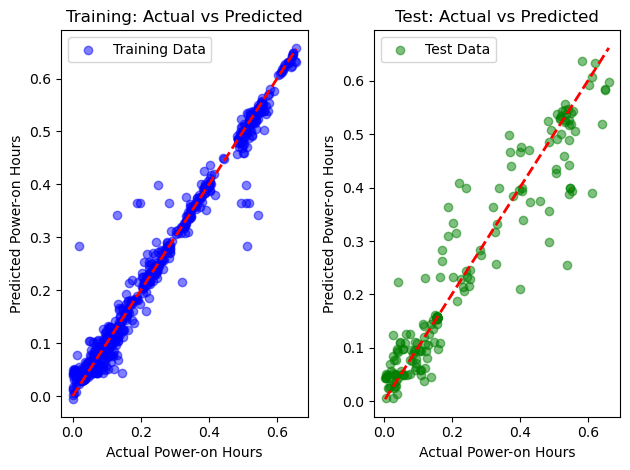

In [22]:
# XGBoost
from xgboost import XGBRegressor

xgb_model = XGBRegressor(n_estimators=50, random_state=42)
xgb_model.fit(X_train_scaled, y_train)
xgb_train_accuracy = xgb_model.score(X_train_scaled, y_train) * 100
xgb_test_accuracy = xgb_model.score(X_test_scaled, y_test) * 100



y_pred_train_xgb = xgb_model.predict(X_train_scaled)
y_pred_test_xgb = xgb_model.predict(X_test_scaled)


metrics_rf = {
    'R2 Score (Train)': r2_score(y_train, y_pred_train_xgb),
    'R2 Score (Test)': r2_score(y_test, y_pred_test_xgb),
    'RMSE (Train)': np.sqrt(mean_squared_error(y_train, y_pred_train_xgb)),
    'RMSE (Test)': np.sqrt(mean_squared_error(y_test, y_pred_test_xgb)),
    'MAE (Train)': mean_absolute_error(y_train, y_pred_train_xgb),
    'MAE (Test)': mean_absolute_error(y_test, y_pred_test_xgb),
    'Explained Variance Score (Train)': explained_variance_score(y_train, y_pred_train_xgb),
    'Explained Variance Score (Test)': explained_variance_score(y_test, y_pred_test_xgb)
}

print("RandomForestRegressor Model Performance Metrics:")
for metric, value in metrics_rf.items():
    print(f"{metric}: {value:.4f}")


plt.subplot(1, 2, 1)
plt.scatter(y_train, y_pred_train_xgb, alpha=0.5, label='Training Data', color='blue')
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Training: Actual vs Predicted')
plt.legend()

plt.subplot(1, 2, 2)
plt.scatter(y_test, y_pred_test_xgb, alpha=0.5, color='green', label='Test Data')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Power-on Hours')
plt.ylabel('Predicted Power-on Hours')
plt.title('Test: Actual vs Predicted')
plt.legend()

plt.tight_layout()
plt.show()

### New methods (include DNN and COX proportional)

Number of samples: 4999
Missing values in selected columns:
duration                                0
event                                   0
n_12: Power Cycle Count                 0
n_5: Reallocated Sector Count           0
n_183: SATA Downshift Error             0
n_184: End-to-End Errors                0
n_187: Reported Uncorrectable Errors    0
n_195: Hardware ECC Recovered           0
dtype: int64


<lifelines.CoxPHFitter: fitted with 4999 total observations, 3999 right-censored observations>
             duration col = 'duration'
                event col = 'event'
      baseline estimation = breslow
   number of observations = 4999
number of events observed = 1000
   partial log-likelihood = -7070.53
         time fit was run = 2025-02-04 14:51:18 UTC

---
                                      coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                                             
n_12: Power Cycle Count              -7.83      0.00      0.29           -8.41           -7.26                0.00                0.00
n_5: Reallocated Sector Count        -0.02      0.98      0.01           -0.03           -0.01                0.97                0.99
n_183: SATA Downshift Error          -0.01      0.99      0.01           -0.02            0.01                0.98                1.01
n_184: End-to-End Errors             -0.20      0.82      0.05           -0.29           -0.10                0.75                0.90
n_187: Reported Uncorrectable Errors  0.30      1.35      0.15            0.00            0.60                1.00                1.82
n_195: Hardware ECC Recovered        -0.04      0.96      0.00           -0.05           -0.04                0.95                0.96

                                      cmp to      z      p  -log2(p)
covariate                                                           
n_12: Power Cycle Count                 0.00 -26.58 <0.005    514.56
n_5: Reallocated Sector Count           0.00  -2.82 <0.005      7.71
n_183: SATA Downshift Error             0.00  -0.91   0.36      1.47
n_184: End-to-End Errors                0.00  -4.16 <0.005     14.92
n_187: Reported Uncorrectable Errors    0.00   1.98   0.05      4.39
n_195: Hardware ECC Recovered           0.00 -11.70 <0.005    102.68
---
Concordance = 0.77
Partial AIC = 14153.05
log-likelihood ratio test = 1721.55 on 6 df
-log2(p) of ll-ratio test = inf

Concordance Index: 0.7731054692903241
Cross-validated Concordance Index scores: [-1.122734054168963, -2.387796004628173, -1.407274107538649, -1.0763416573630644, -1.1979894171101158]
Average CV Concordance Index: -1.4384270481617931


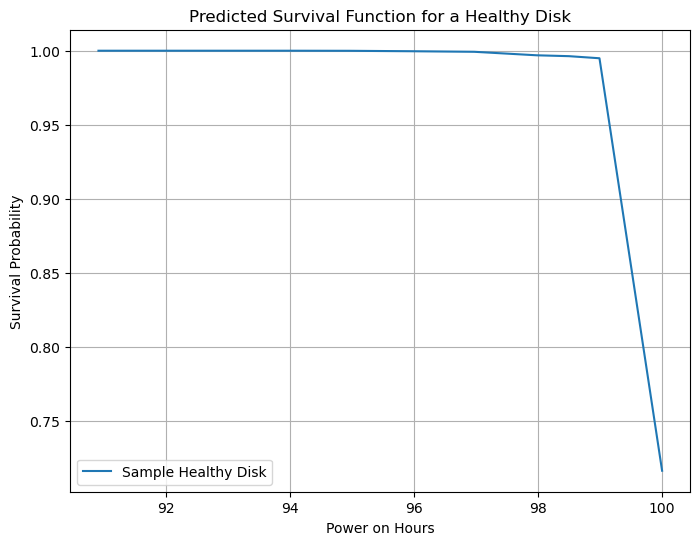

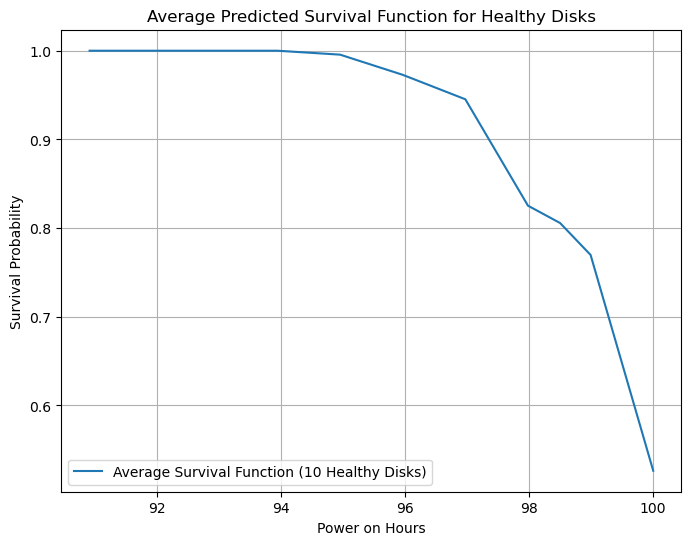

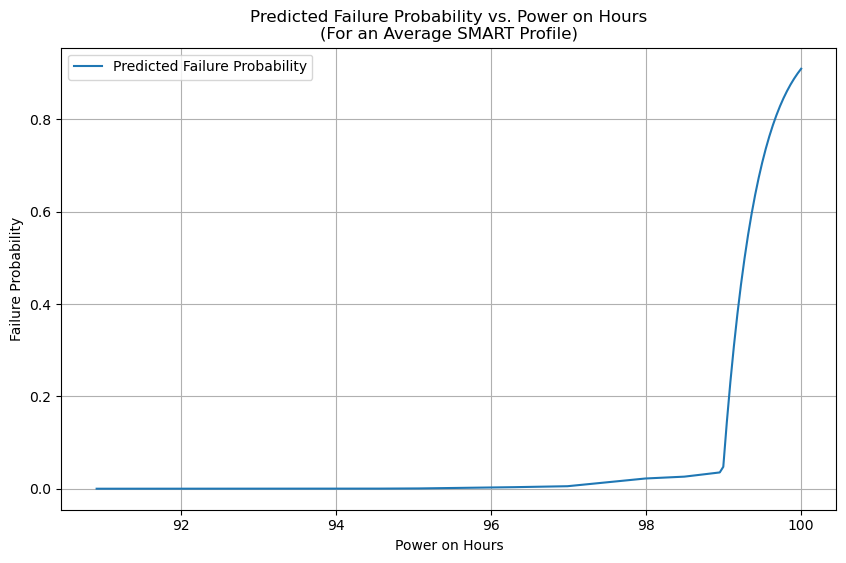

Estimated Median Survival Time (Power on Hours) for the Sample Healthy Disk: 90.9090909090909


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from lifelines import CoxPHFitter
from lifelines.utils import k_fold_cross_validation

file_path = 'project1_dataset.xlsx'
df = pd.read_excel(file_path)
df = df.sample(frac=1.0, random_state=42).reset_index(drop=True)

column_mapping = {
    'r_5': 'r_5: Reallocated Sector Count',
    'n_5': 'n_5: Reallocated Sector Count',
    'r_183': 'r_183: SATA Downshift Error',
    'n_183': 'n_183: SATA Downshift Error',
    'r_184': 'r_184: End-to-End Errors',
    'n_184': 'n_184: End-to-End Errors',
    'r_187': 'r_187: Reported Uncorrectable Errors',
    'n_187': 'n_187: Reported Uncorrectable Errors',
    'r_195': 'r_195: Hardware ECC Recovered',
    'n_195': 'n_195: Hardware ECC Recovered',
    'r_197': 'r_197: Current Pending Sector Count',
    'n_197': 'n_197: Current Pending Sector Count',
    'r_199': 'r_199: Ultra DMA CRC Error Count',
    'n_199': 'n_199: Ultra DMA CRC Error Count',
    'r_171': 'r_171: Program Failed Count',
    'n_171': 'n_171: Program Failed Count',
    'r_172': 'r_172: Erase Failed Count',
    'n_172': 'n_172: Erase Failed Count',
    'n_170': 'n_170: Available Reserved Blocks',
    'n_233': 'n_233: Media Wearout Indicator',
    'r_241': 'r_241: Number of Blocks Written',
    'n_241': 'n_241: Number of Blocks Written',
    'r_242': 'r_242: Number of Blocks Read',
    'n_242': 'n_242: Number of Blocks Read',
    'r_9': 'r_9: Power on Hours',
    'n_9': 'n_9: Power on Hours',
    'r_12': 'r_12: Power Cycle Count',
    'n_12': 'n_12: Power Cycle Count',
    'r_174': 'r_174: Unexpected Power Loss Count',
    'n_174': 'n_174: Unexpected Power Loss Count',
    'failure': 'failure'
}
df.rename(columns=column_mapping, inplace=True)

df_surv = df.copy()
df_surv['duration'] = df_surv['n_9: Power on Hours']
df_surv['event'] = df_surv['failure']

covariates = [
    'n_12: Power Cycle Count',         
    'n_5: Reallocated Sector Count',    
    'n_183: SATA Downshift Error',       
    'n_184: End-to-End Errors',          
    'n_187: Reported Uncorrectable Errors',  
    'n_195: Hardware ECC Recovered'         
]

print("Number of samples:", df_surv.shape[0])
print("Missing values in selected columns:")
print(df_surv[['duration', 'event'] + covariates].isnull().sum())

cph = CoxPHFitter()
cph.fit(df_surv[['duration', 'event'] + covariates], duration_col='duration', event_col='event')

cph.print_summary()
print("Concordance Index:", cph.concordance_index_)

cv_results = k_fold_cross_validation(cph, df_surv[['duration', 'event'] + covariates], duration_col='duration', event_col='event', k=5)
print("Cross-validated Concordance Index scores:", cv_results)
print("Average CV Concordance Index:", np.mean(cv_results))

sample_healthy_disk = df_surv[df_surv['failure'] == 0].iloc[0]
sample_covariates = sample_healthy_disk[covariates].to_frame().T
sample_surv_func = cph.predict_survival_function(sample_covariates)

plt.figure(figsize=(8,6))
plt.plot(sample_surv_func.index, sample_surv_func.values.flatten(), label='Sample Healthy Disk')
plt.xlabel("Power on Hours")
plt.ylabel("Survival Probability")
plt.title("Predicted Survival Function for a Healthy Disk")
plt.legend()
plt.grid(True)
plt.show()

group_healthy_disks = df_surv[df_surv['failure'] == 0].iloc[:10]
group_surv_funcs = cph.predict_survival_function(group_healthy_disks[covariates])
avg_surv_func = group_surv_funcs.mean(axis=1)

plt.figure(figsize=(8,6))
plt.plot(avg_surv_func.index, avg_surv_func.values, label='Average Survival Function (10 Healthy Disks)')
plt.xlabel("Power on Hours")
plt.ylabel("Survival Probability")
plt.title("Average Predicted Survival Function for Healthy Disks")
plt.legend()
plt.grid(True)
plt.show()

mean_profile = df_surv[covariates].mean().to_frame().T
time_range = np.linspace(df_surv['duration'].min(), df_surv['duration'].max(), 200)
predicted_survival = cph.predict_survival_function(mean_profile, times=time_range)
predicted_failure_probability = 1 - predicted_survival

plt.figure(figsize=(10, 6))
plt.plot(time_range, predicted_failure_probability.values.flatten(), label='Predicted Failure Probability')
plt.xlabel("Power on Hours")
plt.ylabel("Failure Probability")
plt.title("Predicted Failure Probability vs. Power on Hours\n(For an Average SMART Profile)")
plt.legend()
plt.grid(True)
plt.show()

median_survival = sample_surv_func[sample_surv_func <= 0.5].index.min()
print("Estimated Median Survival Time (Power on Hours) for the Sample Healthy Disk:", median_survival)


## Part 1 answers:
(using DNN method)

DataFrame Columns after renaming:
['r_5: Reallocated Sector Count', 'n_5: Reallocated Sector Count', 'r_183: SATA Downshift Error', 'n_183: SATA Downshift Error', 'r_184: End-to-End Errors', 'n_184: End-to-End Errors', 'r_187: Reported Uncorrectable Errors', 'n_187: Reported Uncorrectable Errors', 'r_195: Hardware ECC Recovered', 'n_195: Hardware ECC Recovered', 'r_197: Current Pending Sector Count', 'n_197: Current Pending Sector Count', 'r_199: Ultra DMA CRC Error Count', 'n_199: Ultra DMA CRC Error Count', 'r_171: Program Failed Count', 'n_171: Program Failed Count', 'r_172: Erase Failed Count', 'n_172: Erase Failed Count', 'n_170: Available Reserved Blocks', 'n_233: Media Wearout Indicator', 'r_241: Number of Blocks Written', 'n_241: Number of Blocks Written', 'r_242: Number of Blocks Read', 'n_242: Number of Blocks Read', 'r_9: Power on Hours', 'n_9: Power on Hours', 'r_12: Power Cycle Count', 'n_12: Power Cycle Count', 'r_174: Unexpected Power Loss Count', 'n_174: Unexpected Powe

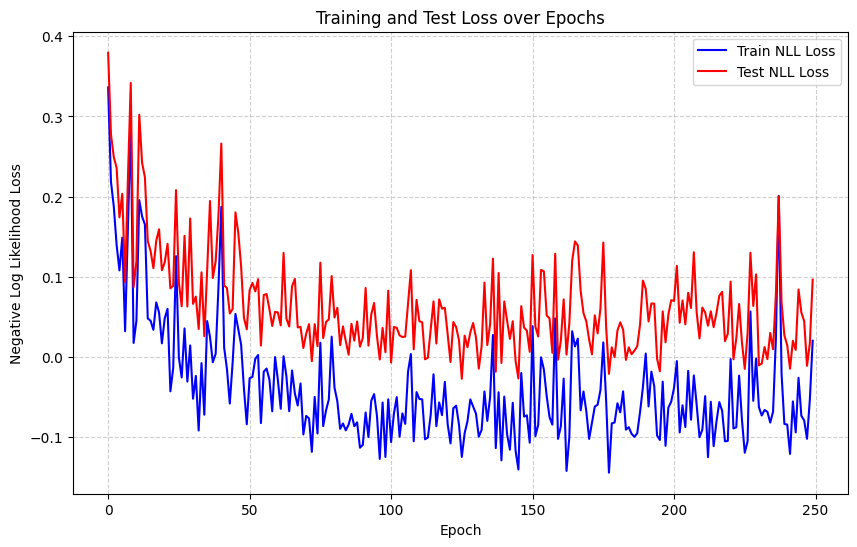


Test Set Metrics:
Mean Squared Error (MSE): 0.0406
Mean Absolute Error (MAE): 0.0687
R² Score: 0.0262
Percentage Accuracy (within 10% relative error): 55.30%


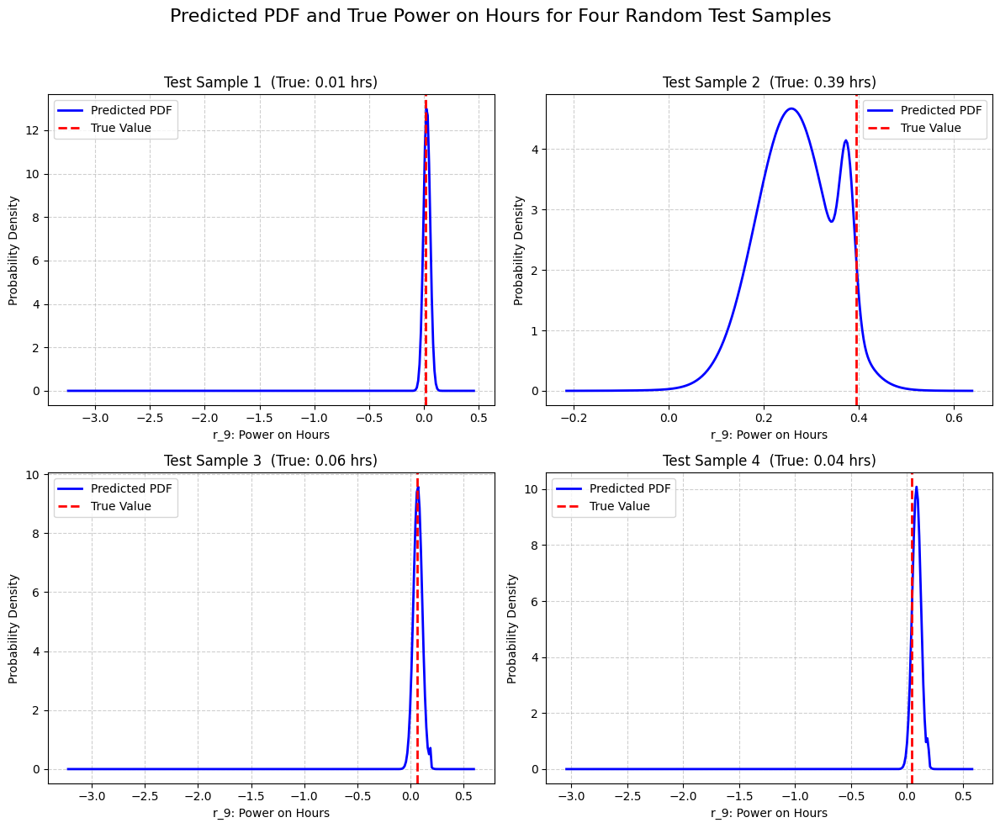

In [1]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

np.random.seed(42)
torch.manual_seed(42)

file_path = 'project1_dataset.xlsx'
if not os.path.exists(file_path):
    raise FileNotFoundError(f"Dataset file not found at {file_path}")

df = pd.read_excel(file_path)

column_mapping = {
    'r_5': 'r_5: Reallocated Sector Count',
    'n_5': 'n_5: Reallocated Sector Count',
    'r_183': 'r_183: SATA Downshift Error',
    'n_183': 'n_183: SATA Downshift Error',
    'r_184': 'r_184: End-to-End Errors',
    'n_184': 'n_184: End-to-End Errors',
    'r_187': 'r_187: Reported Uncorrectable Errors',
    'n_187': 'n_187: Reported Uncorrectable Errors',
    'r_195': 'r_195: Hardware ECC Recovered',
    'n_195': 'n_195: Hardware ECC Recovered',
    'r_197': 'r_197: Current Pending Sector Count',
    'n_197': 'n_197: Current Pending Sector Count',
    'r_199': 'r_199: Ultra DMA CRC Error Count',
    'n_199': 'n_199: Ultra DMA CRC Error Count',
    'r_171': 'r_171: Program Failed Count',
    'n_171': 'n_171: Program Failed Count',
    'r_172': 'r_172: Erase Failed Count',
    'n_172': 'n_172: Erase Failed Count',
    'n_170': 'n_170: Available Reserved Blocks',
    'n_233': 'n_233: Media Wearout Indicator',
    'r_241': 'r_241: Number of Blocks Written',
    'n_241': 'n_241: Number of Blocks Written',
    'r_242': 'r_242: Number of Blocks Read',
    'n_242': 'n_242: Number of Blocks Read',
    'r_9': 'r_9: Power on Hours',
    'n_9': 'n_9: Power on Hours',
    'r_12': 'r_12: Power Cycle Count',
    'n_12': 'n_12: Power Cycle Count',
    'r_174': 'r_174: Unexpected Power Loss Count',
    'n_174': 'n_174: Unexpected Power Loss Count',
    'failure': 'failure'
}
df.rename(columns=column_mapping, inplace=True)
df.columns = df.columns.str.strip()

print("DataFrame Columns after renaming:")
print(df.columns.tolist())

target_column = 'r_9: Power on Hours'
if target_column not in df.columns:
    raise KeyError(f"Expected column '{target_column}' not found in DataFrame.")

feature_columns = [col for col in df.columns if col not in [target_column, 'failure']]
print("\nUsing the following feature columns for prediction:")
print(feature_columns)

X_df = df[feature_columns]
y_df = df[target_column]

X_data = X_df.values.astype(np.float32)
y_data = y_df.values.reshape(-1, 1).astype(np.float32)

feature_names = X_df.columns.tolist()

scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_data_scaled = scaler_X.fit_transform(X_data)
y_data_scaled = scaler_y.fit_transform(y_data)

X_train_np, X_test_np, y_train_np, y_test_np = train_test_split(
    X_data_scaled, y_data_scaled, test_size=0.2, random_state=42
)

X_train = torch.from_numpy(X_train_np)
y_train = torch.from_numpy(y_train_np)
X_test = torch.from_numpy(X_test_np)
y_test = torch.from_numpy(y_test_np)

input_dim = X_train.shape[1]
print(f"\nInput dimension (number of features): {input_dim}")
print(f"Training samples: {X_train.shape[0]}, Test samples: {X_test.shape[0]}")

num_mixtures = 3

class MDN(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_mixtures):
        super(MDN, self).__init__()
        self.num_mixtures = num_mixtures
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.fc3 = nn.Linear(hidden_dim, num_mixtures * 3)
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        output = self.fc3(x)
        return output

def mdn_loss(y_pred, y, num_mixtures):
    batch_size = y.size(0)
    out_size = num_mixtures
    pi = y_pred[:, :out_size]
    mu = y_pred[:, out_size:2*out_size]
    sigma = y_pred[:, 2*out_size:3*out_size]
    pi = torch.softmax(pi, dim=1)
    sigma = torch.nn.functional.softplus(sigma) + 1e-6
    y_expanded = y.expand_as(mu)
    constant = math.sqrt(2 * math.pi)
    prob = 1.0 / (sigma * constant) * torch.exp(-0.5 * ((y_expanded - mu) / sigma) ** 2)
    weighted_prob = pi * prob
    total_prob = torch.sum(weighted_prob, dim=1, keepdim=True)
    nll = -torch.log(total_prob + 1e-8)
    return torch.mean(nll)

hidden_dim = 32
model = MDN(input_dim, hidden_dim, num_mixtures)
optimizer = optim.Adam(model.parameters(), lr=0.01)

num_epochs = 250
batch_size = 32
train_loss_history = []
test_loss_history = []

model.train()
for epoch in range(num_epochs):
    permutation = torch.randperm(X_train.size(0))
    epoch_loss = 0.0
    for i in range(0, X_train.size(0), batch_size):
        indices = permutation[i:i+batch_size]
        batch_x = X_train[indices]
        batch_y = y_train[indices]
        optimizer.zero_grad()
        outputs = model(batch_x)
        loss = mdn_loss(outputs, batch_y, num_mixtures)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    model.eval()
    with torch.no_grad():
        train_loss = mdn_loss(model(X_train), y_train, num_mixtures).item()
        test_loss = mdn_loss(model(X_test), y_test, num_mixtures).item()
    train_loss_history.append(train_loss)
    test_loss_history.append(test_loss)
    model.train()
    if (epoch + 1) % 25 == 0:
        avg_batch_loss = epoch_loss / (X_train.size(0) / batch_size)
        print(f"Epoch [{epoch+1}/{num_epochs}]: Batch Loss: {avg_batch_loss:.4f} | Train NLL: {train_loss:.4f} | Test NLL: {test_loss:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(train_loss_history, label='Train NLL Loss', color='blue')
plt.plot(test_loss_history, label='Test NLL Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Negative Log Likelihood Loss')
plt.title('Training and Test Loss over Epochs')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

def softmax_np(x):
    e_x = np.exp(x - np.max(x))
    return e_x / np.sum(e_x)

model.eval()
all_pred_means = []
with torch.no_grad():
    for i in range(X_test.shape[0]):
        sample = X_test[i].unsqueeze(0)
        output = model(sample)
        output_np = output.detach().cpu().numpy().reshape(3 * num_mixtures)
        pi_logits = output_np[:num_mixtures]
        mu_pred = output_np[num_mixtures:2*num_mixtures]
        weights = softmax_np(pi_logits)
        pred_mean = np.sum(weights * mu_pred)
        all_pred_means.append(pred_mean)
all_pred_means = np.array(all_pred_means).reshape(-1, 1)
all_pred_means_orig = scaler_y.inverse_transform(all_pred_means)
y_test_orig = scaler_y.inverse_transform(y_test_np)
mse = mean_squared_error(y_test_orig, all_pred_means_orig)
mae = mean_absolute_error(y_test_orig, all_pred_means_orig)
r2 = r2_score(y_test_orig, all_pred_means_orig)
threshold = 0.1
accuracy = np.mean(np.abs(all_pred_means_orig - y_test_orig) / y_test_orig < threshold)
print("\nTest Set Metrics:")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R² Score: {r2:.4f}")
print(f"Percentage Accuracy (within 10% relative error): {accuracy * 100:.2f}%")

def mixture_pdf(x, pi, mu, sigma):
    pdf = np.zeros_like(x)
    for i in range(len(pi)):
        pdf += pi[i] * (1.0 / (sigma[i] * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mu[i]) / sigma[i])**2)
    return pdf

rand_indices_4 = np.random.choice(X_test.shape[0], size=4, replace=False)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i, idx in enumerate(rand_indices_4):
    x_sample = X_test[idx].unsqueeze(0)
    with torch.no_grad():
        output = model(x_sample)
    output = output.detach().cpu().numpy().reshape(3 * num_mixtures)
    pi_logits = output[:num_mixtures]
    mu_pred = output[num_mixtures:2*num_mixtures]
    sigma_raw = output[2*num_mixtures:3*num_mixtures]
    pi = softmax_np(pi_logits)
    sigma = np.log(1 + np.exp(sigma_raw)) + 1e-6
    x_min_scaled = np.min(mu_pred - 3 * sigma)
    x_max_scaled = np.max(mu_pred + 3 * sigma)
    x_range_scaled = np.linspace(x_min_scaled, x_max_scaled, 300)
    pdf_scaled = mixture_pdf(x_range_scaled, pi, mu_pred, sigma)
    x_range_orig = scaler_y.inverse_transform(x_range_scaled.reshape(-1, 1)).flatten()
    std_target = scaler_y.scale_[0]
    pdf_orig = pdf_scaled / std_target
    true_y_scaled = y_test_np[idx][0]
    true_y_orig = scaler_y.inverse_transform(np.array([[true_y_scaled]]))[0, 0]
    axes[i].plot(x_range_orig, pdf_orig, color='blue', lw=2, label='Predicted PDF')
    axes[i].axvline(x=true_y_orig, color='red', linestyle='--', lw=2, label='True Value')
    axes[i].set_title(f"Test Sample {i+1}  (True: {true_y_orig:.2f} hrs)")
    axes[i].set_xlabel("r_9: Power on Hours")
    axes[i].set_ylabel("Probability Density")
    axes[i].legend()
    axes[i].grid(True, linestyle='--', alpha=0.6)

plt.suptitle("Predicted PDF and True Power on Hours for Four Random Test Samples", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## Part 2


Analyzing thresholds for r_5: Reallocated Sector Count


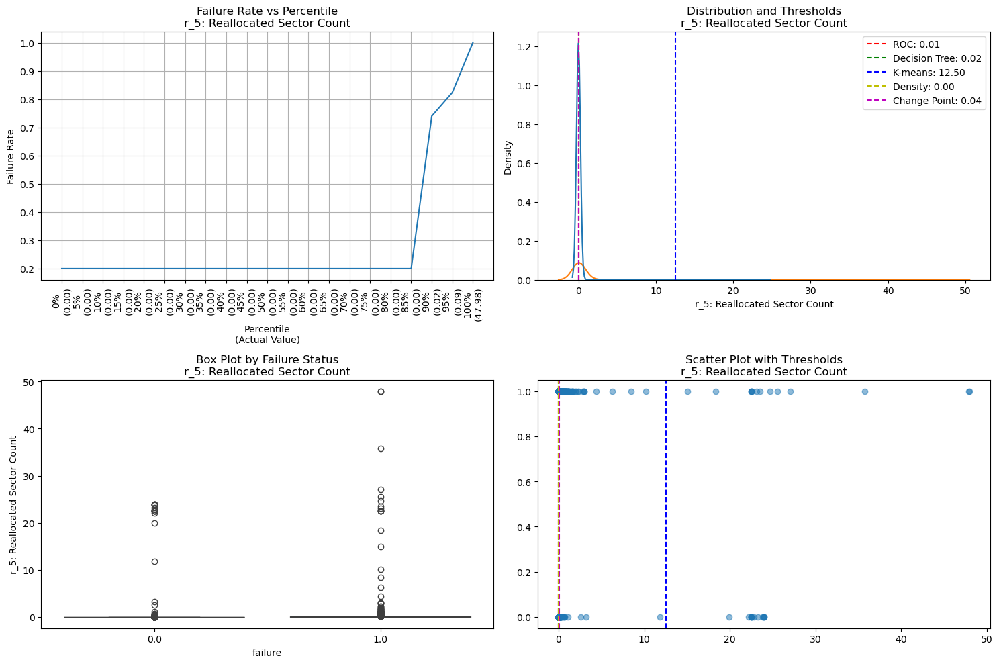


Analyzing thresholds for n_5: Reallocated Sector Count


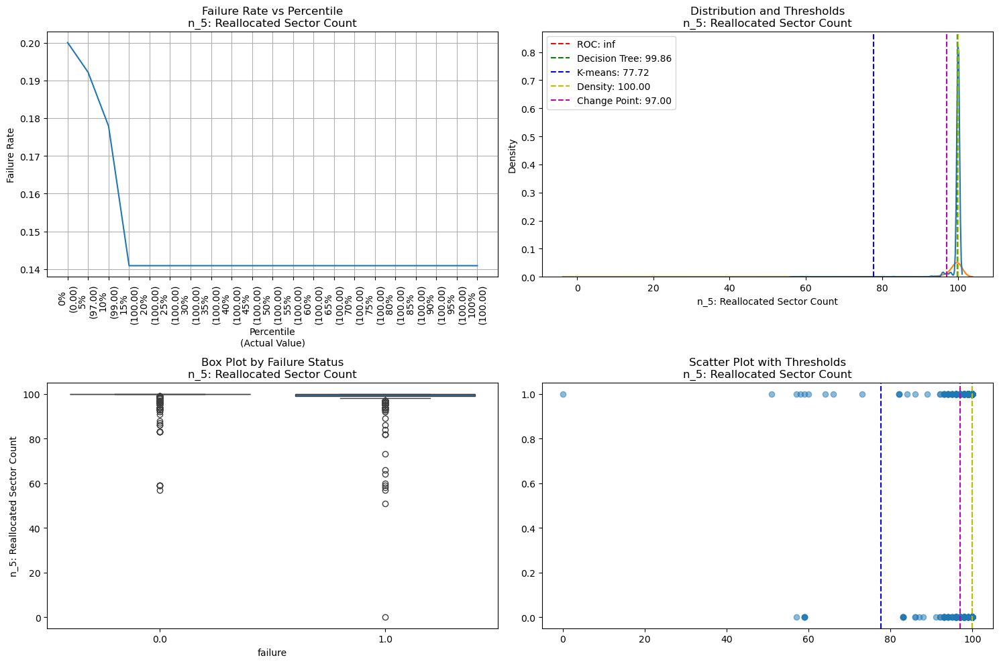


Analyzing thresholds for r_183: SATA Downshift Error


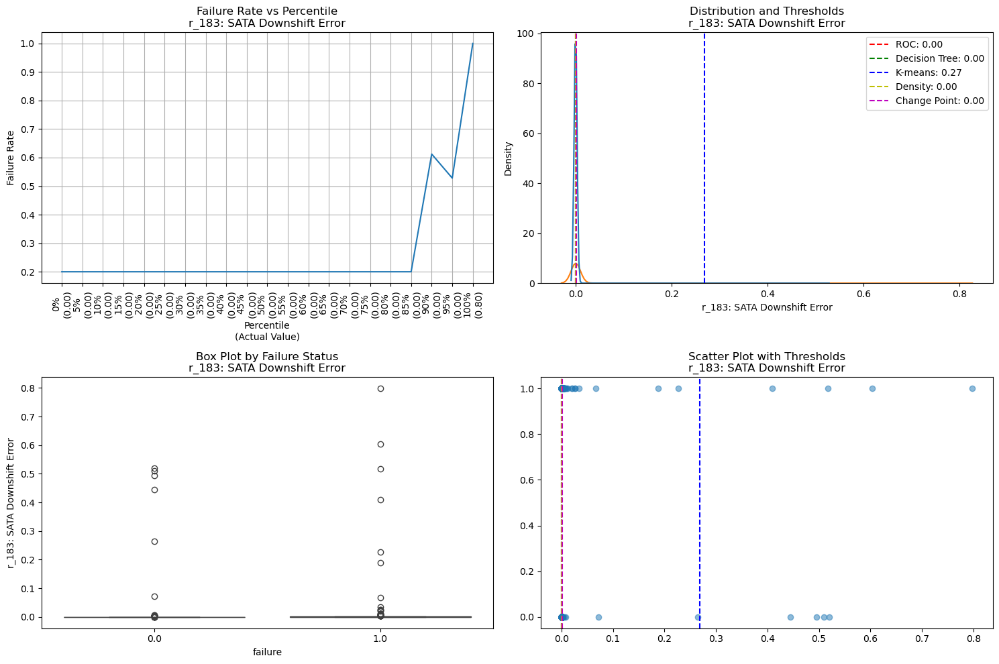


Analyzing thresholds for n_183: SATA Downshift Error


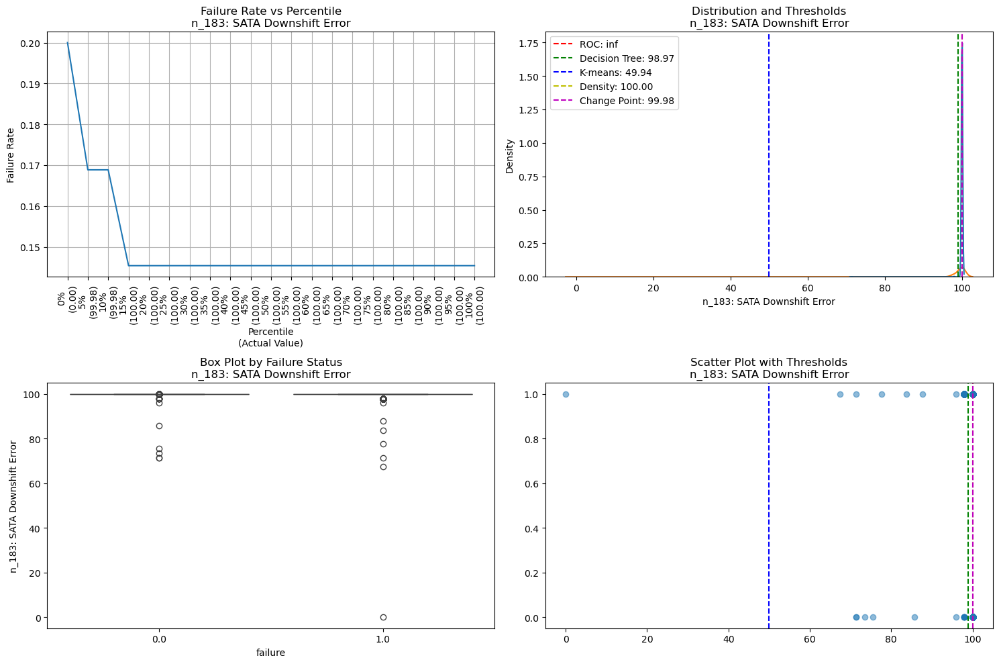


Analyzing thresholds for r_184: End-to-End Errors


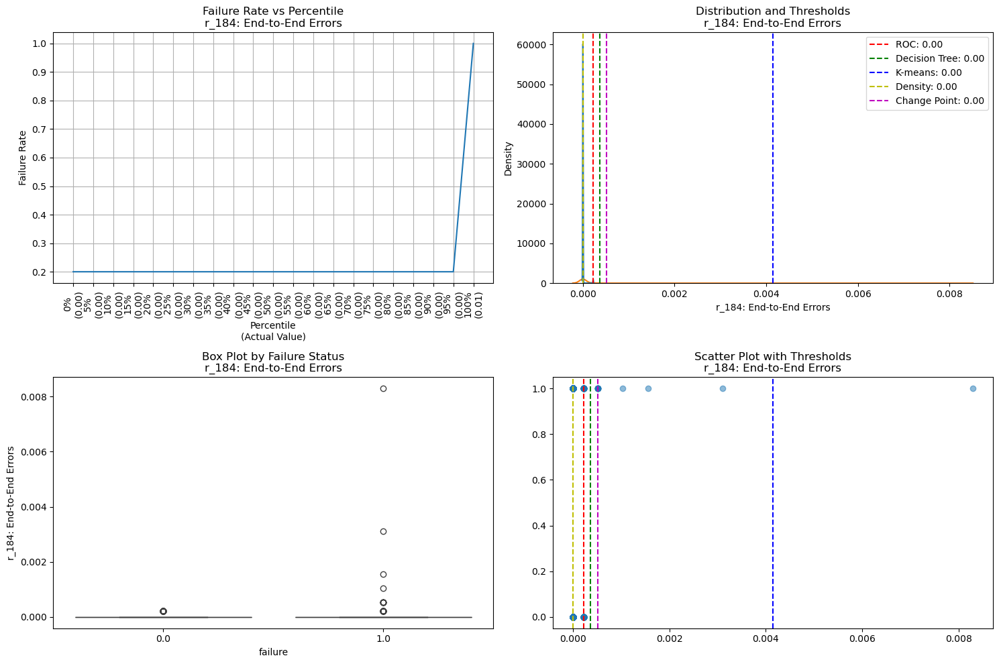


Analyzing thresholds for n_184: End-to-End Errors


/home/andre/miniconda3/envs/storage-venv/lib/python3.12/site-packages/kneed/knee_locator.py:225: RuntimeWarning: invalid value encountered in divide
  return (a - min(a)) / (max(a) - min(a))


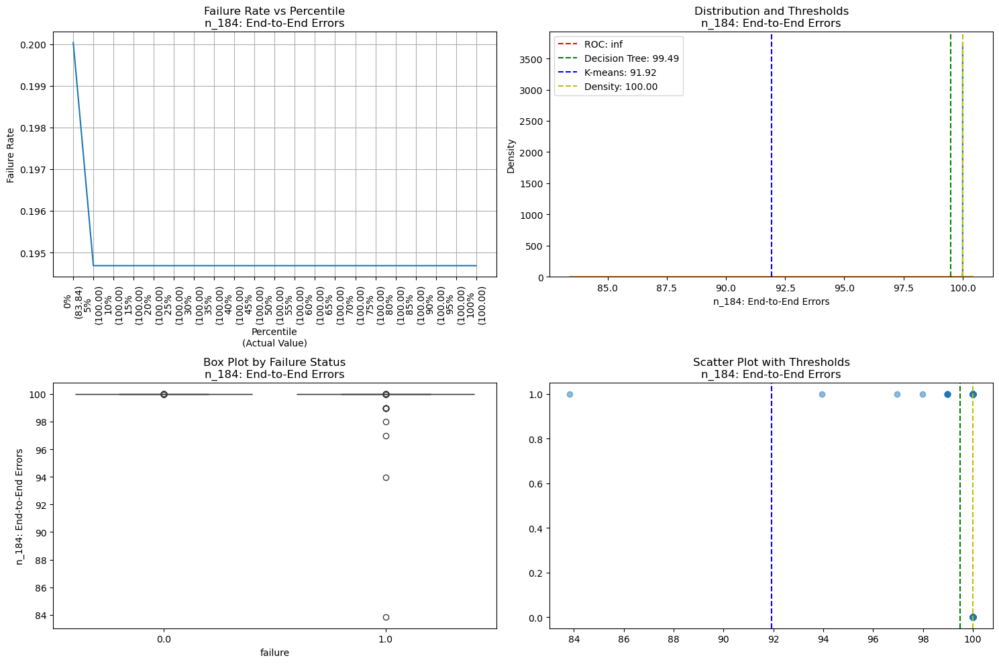


Analyzing thresholds for r_187: Reported Uncorrectable Errors


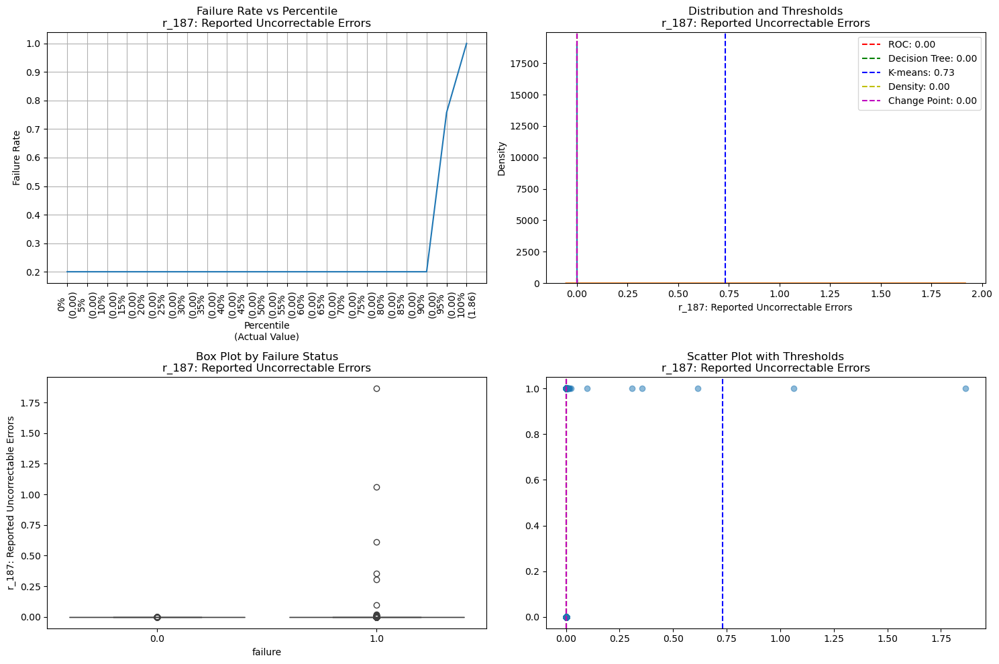


Analyzing thresholds for n_187: Reported Uncorrectable Errors


/home/andre/miniconda3/envs/storage-venv/lib/python3.12/site-packages/kneed/knee_locator.py:225: RuntimeWarning: invalid value encountered in divide
  return (a - min(a)) / (max(a) - min(a))


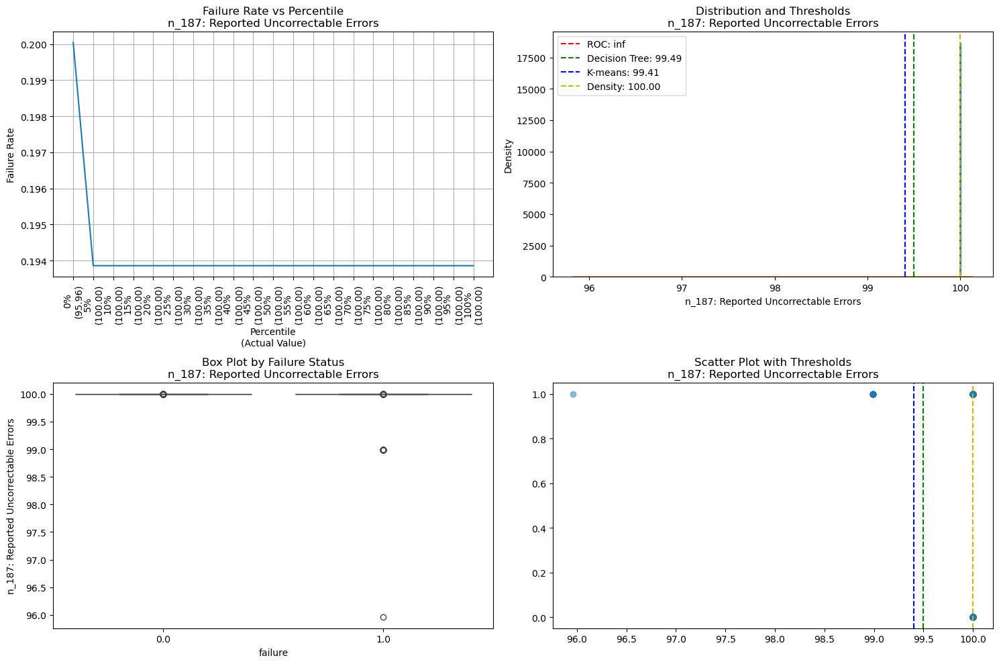


Analyzing thresholds for r_195: Hardware ECC Recovered


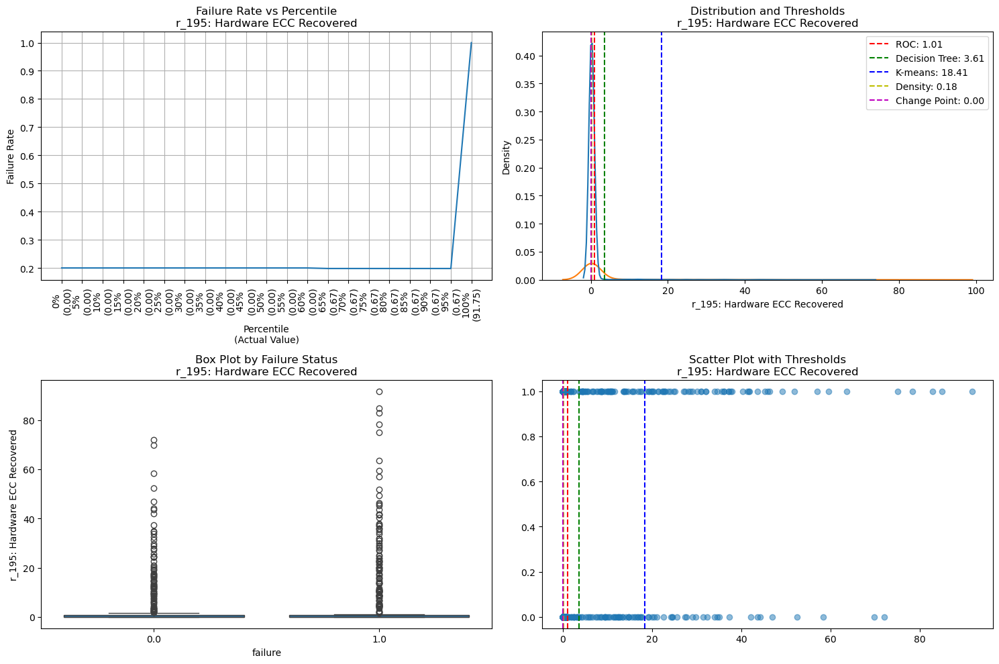


Analyzing thresholds for n_195: Hardware ECC Recovered


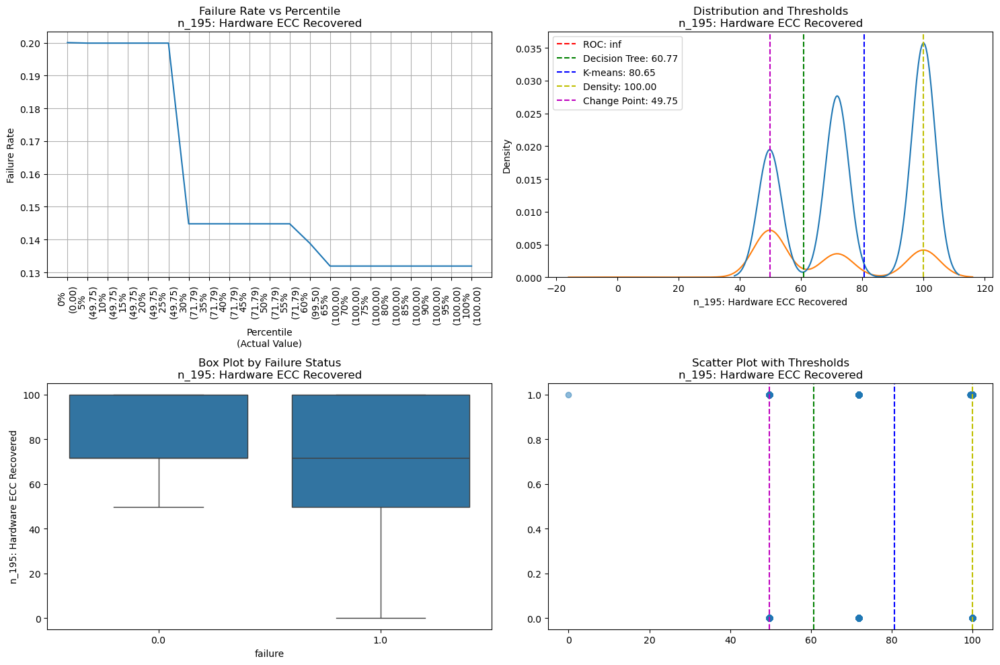


Analyzing thresholds for r_197: Current Pending Sector Count


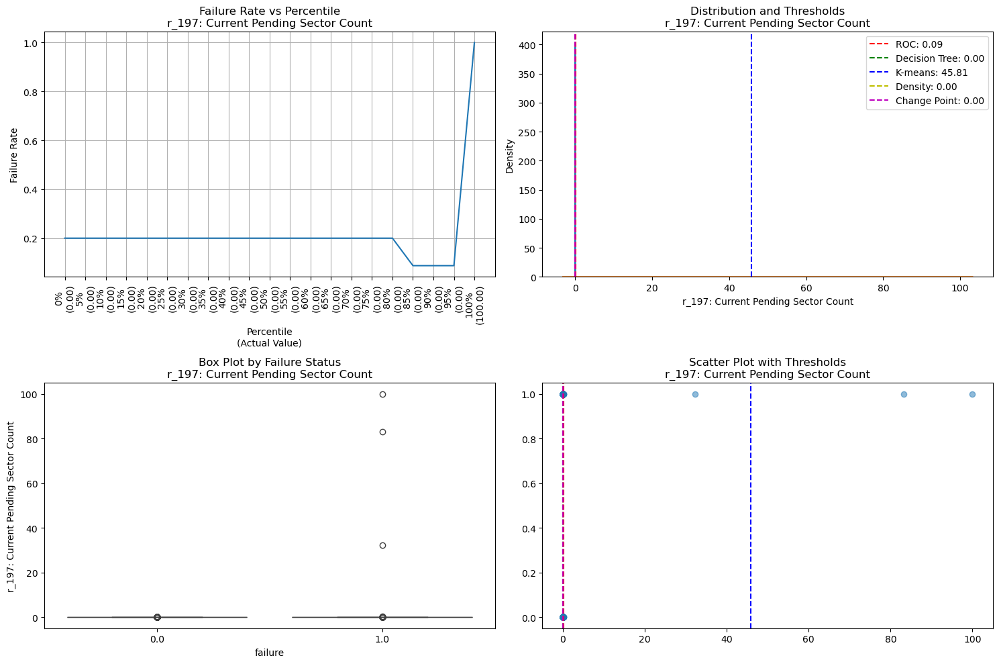


Analyzing thresholds for n_197: Current Pending Sector Count


/home/andre/miniconda3/envs/storage-venv/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/home/andre/miniconda3/envs/storage-venv/lib/python3.12/site-packages/kneed/knee_locator.py:225: RuntimeWarning: invalid value encountered in divide
  return (a - min(a)) / (max(a) - min(a))
/tmp/ipykernel_29357/689890681.py:94: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=column, hue='failure')


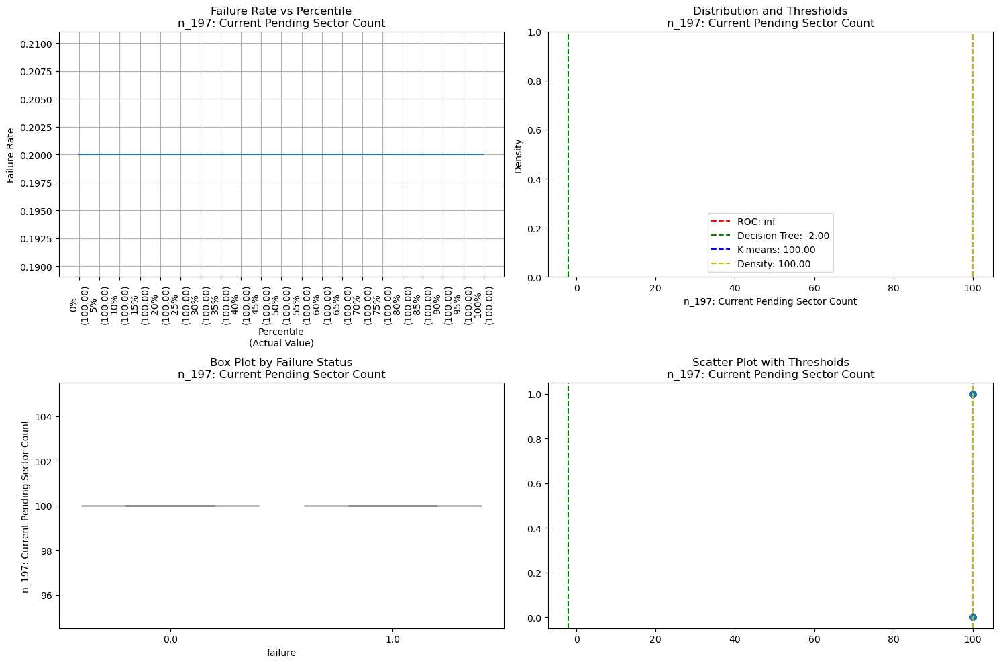


Analyzing thresholds for r_199: Ultra DMA CRC Error Count


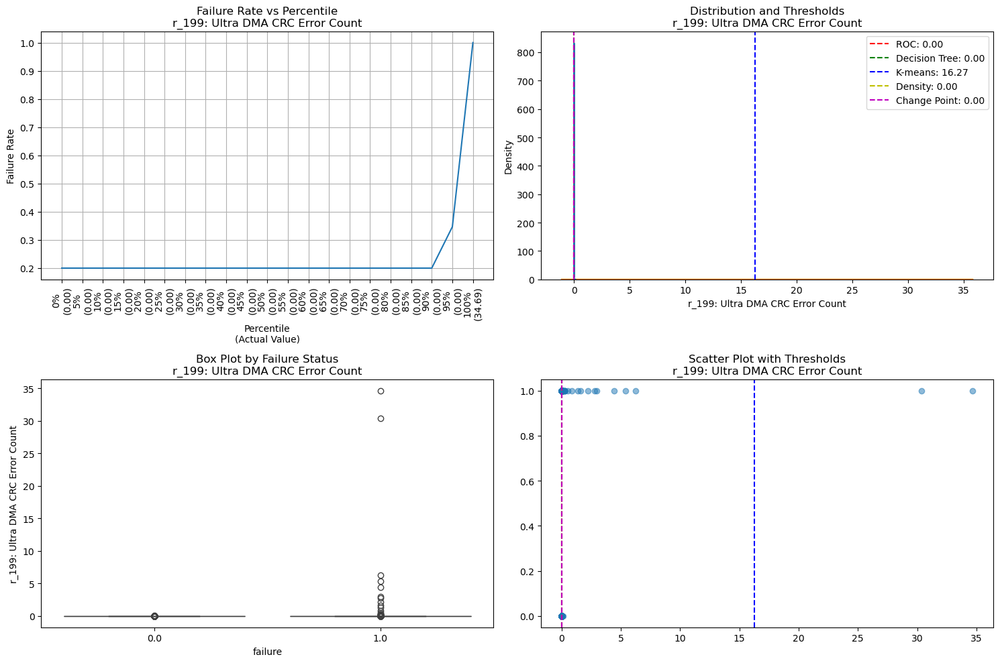


Analyzing thresholds for n_199: Ultra DMA CRC Error Count


/home/andre/miniconda3/envs/storage-venv/lib/python3.12/site-packages/kneed/knee_locator.py:225: RuntimeWarning: invalid value encountered in divide
  return (a - min(a)) / (max(a) - min(a))


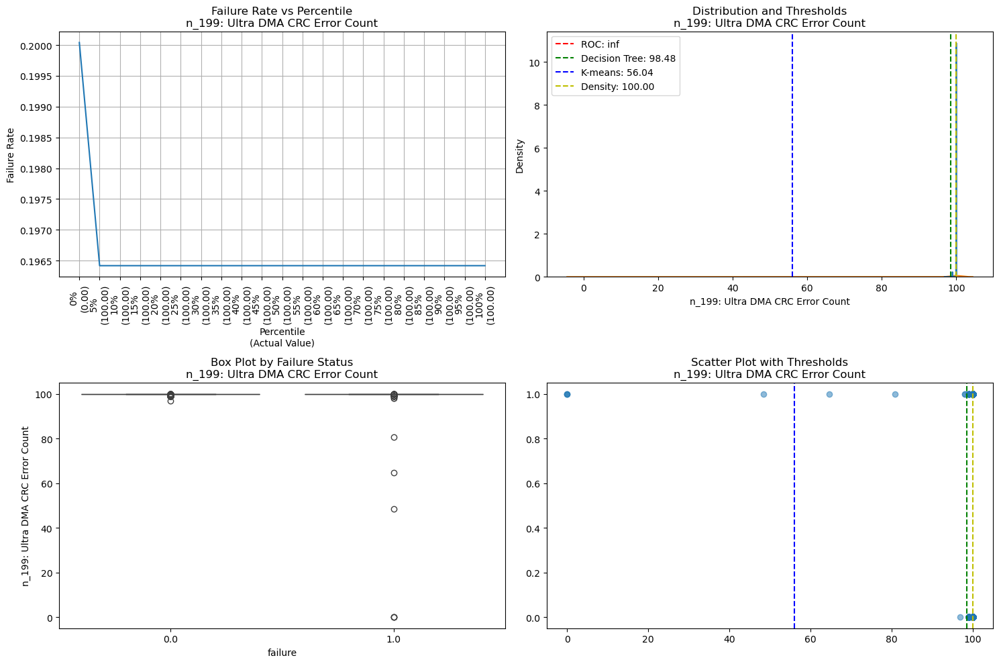


Analyzing thresholds for r_171: Program Failed Count


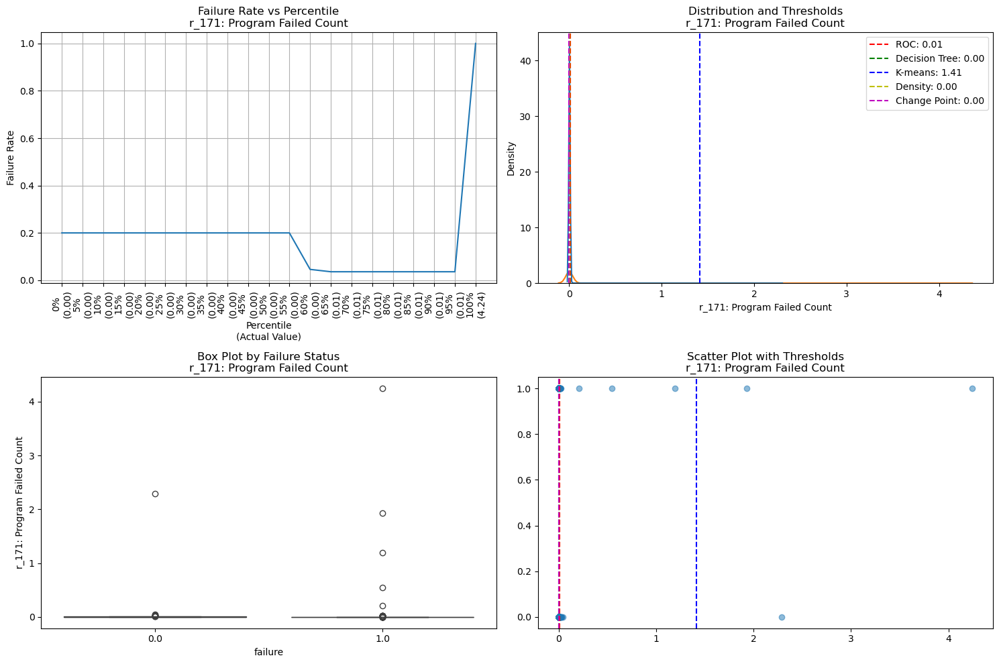


Analyzing thresholds for n_171: Program Failed Count


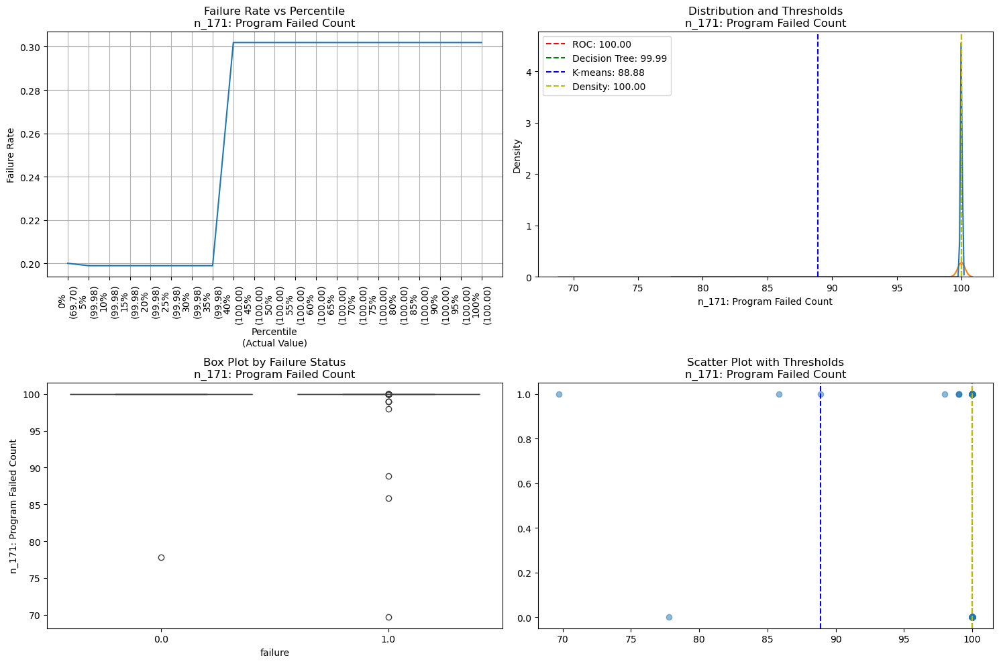


Analyzing thresholds for r_172: Erase Failed Count


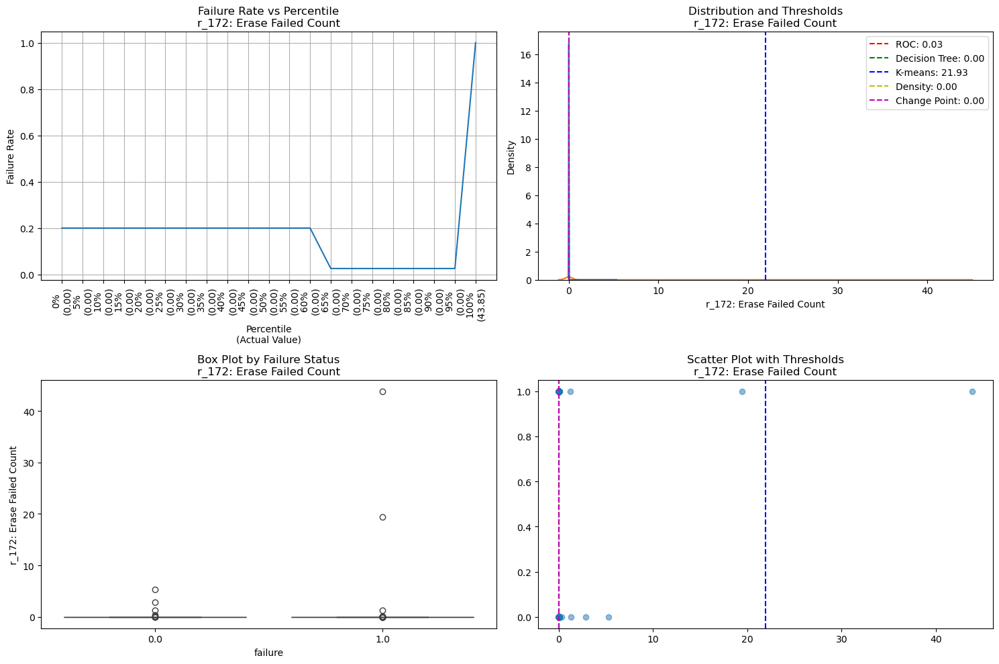


Analyzing thresholds for n_172: Erase Failed Count


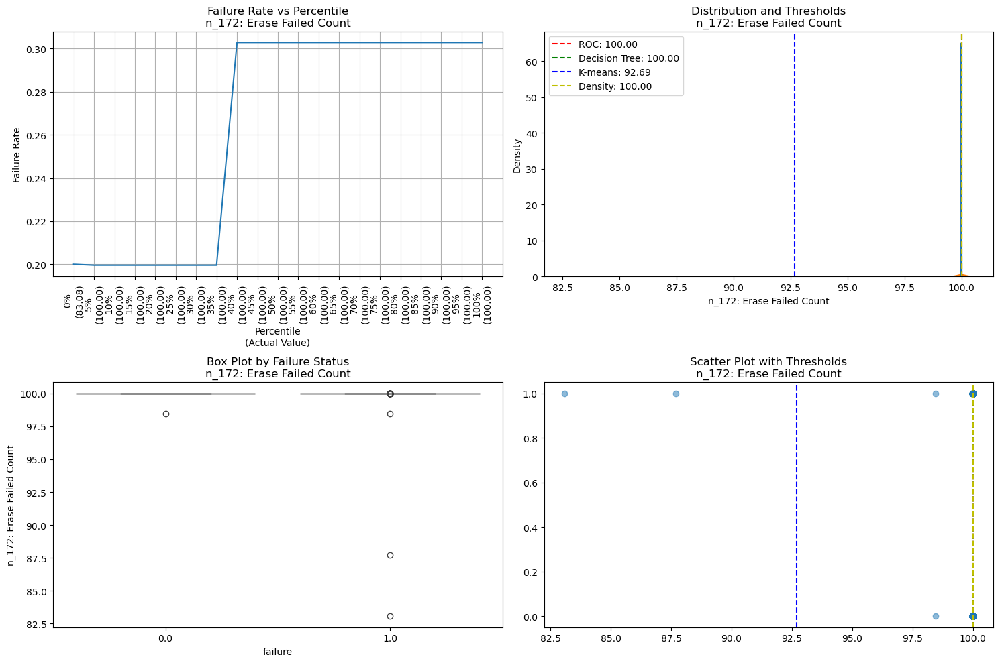


Analyzing thresholds for n_170: Available Reserved Blocks


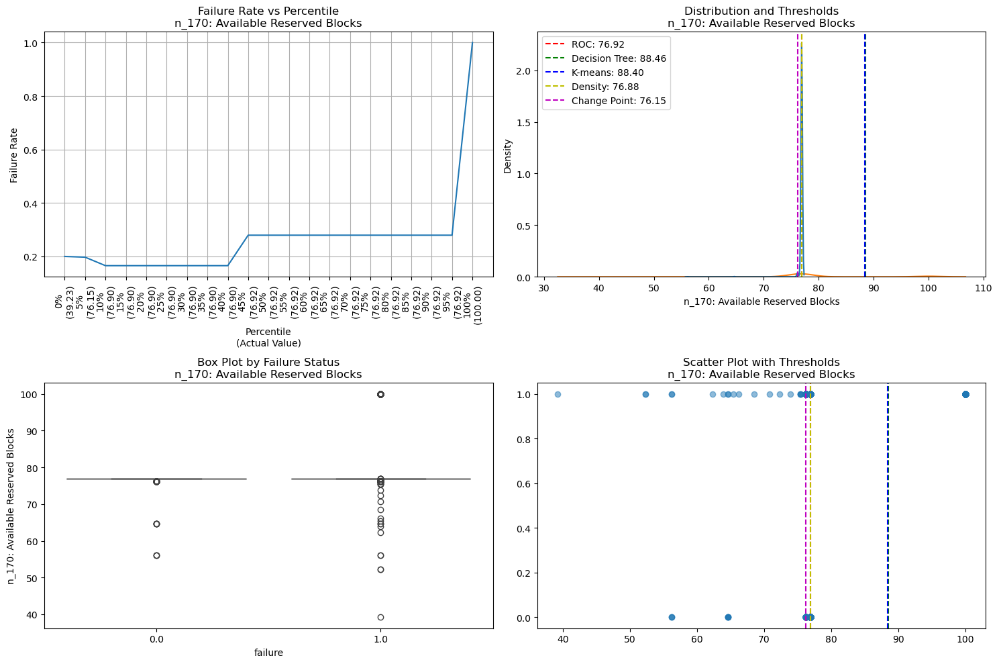


Analyzing thresholds for n_233: Media Wearout Indicator


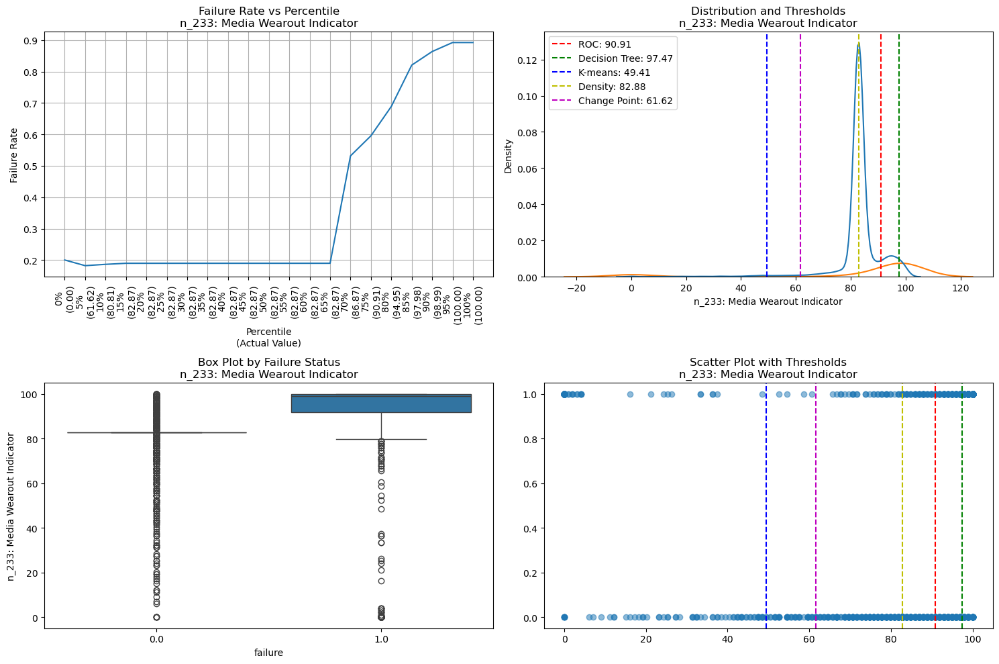


Analyzing thresholds for r_241: Number of Blocks Written


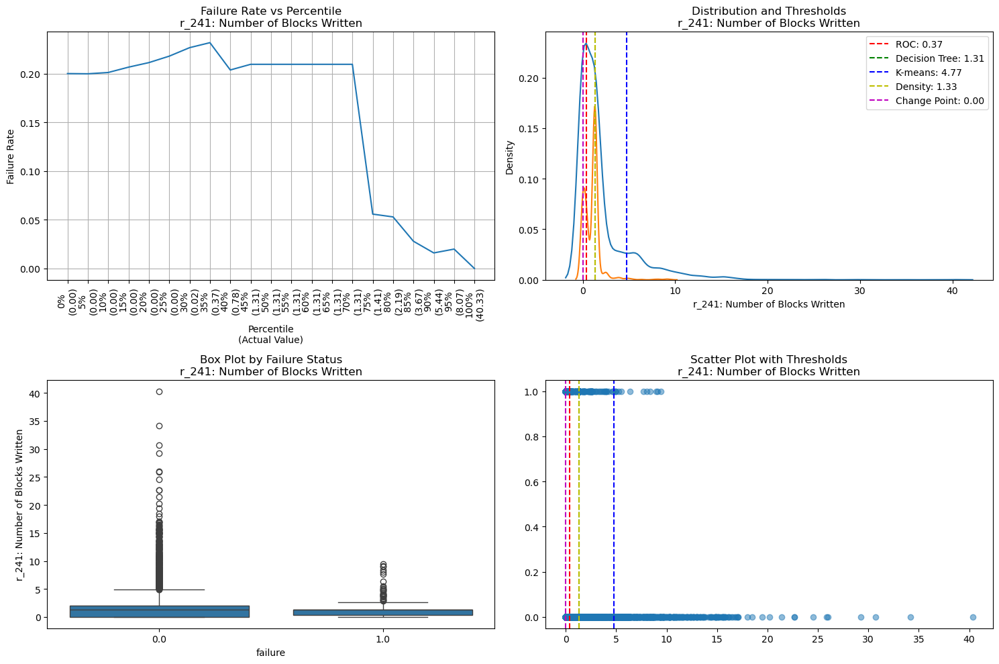


Analyzing thresholds for n_241: Number of Blocks Written


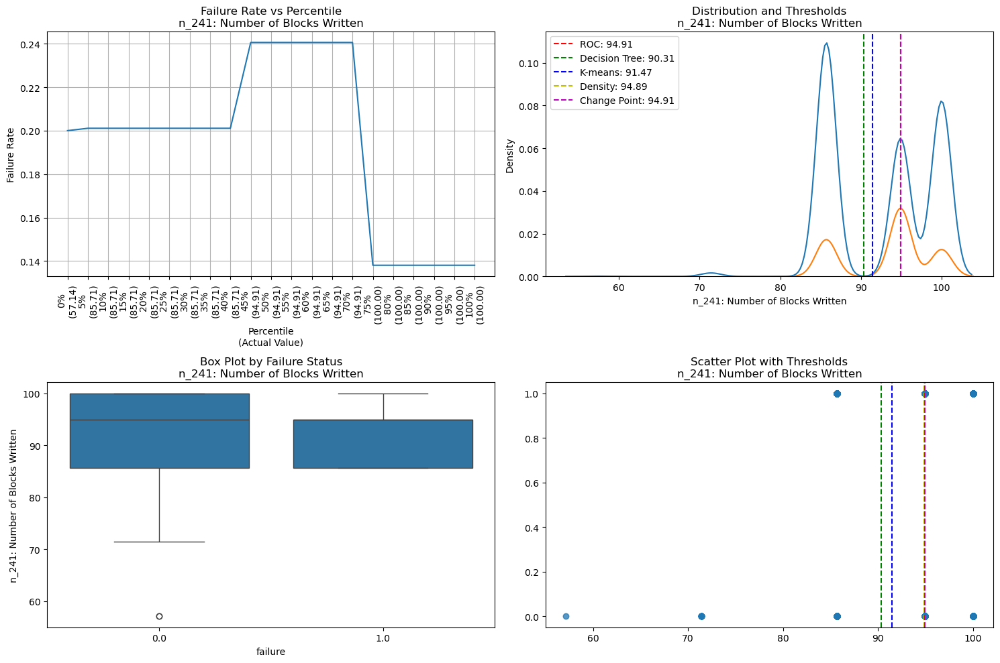


Analyzing thresholds for r_242: Number of Blocks Read


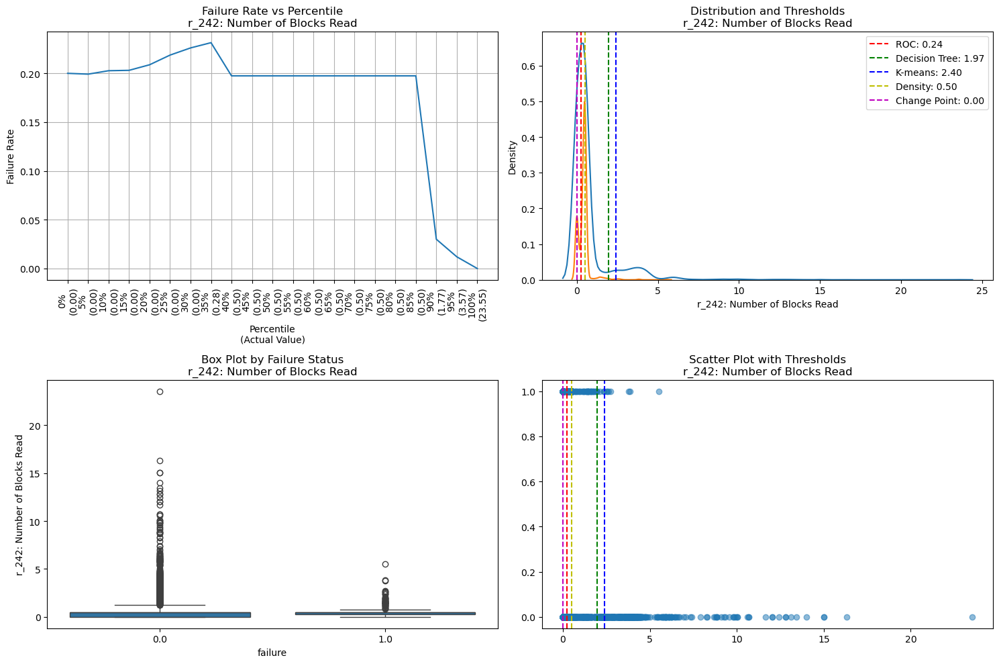


Analyzing thresholds for n_242: Number of Blocks Read


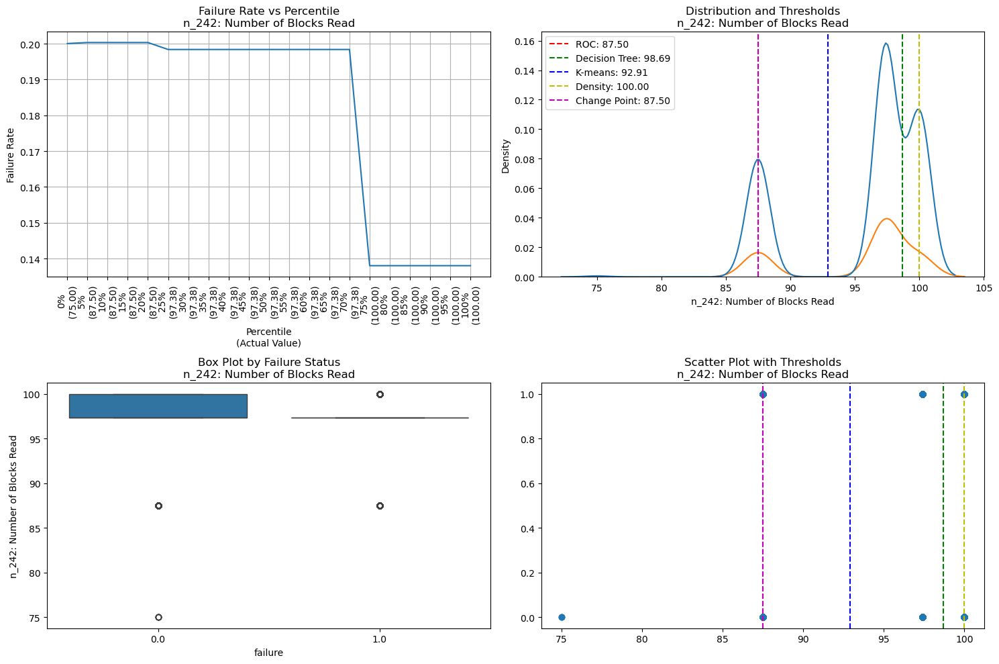


Analyzing thresholds for r_9: Power on Hours


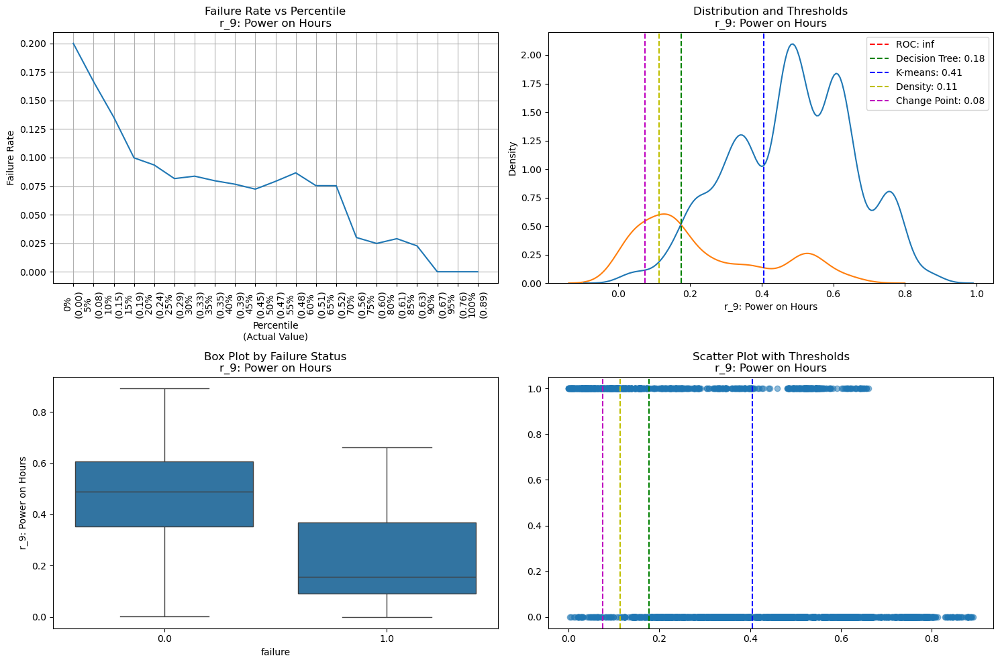


Analyzing thresholds for n_9: Power on Hours


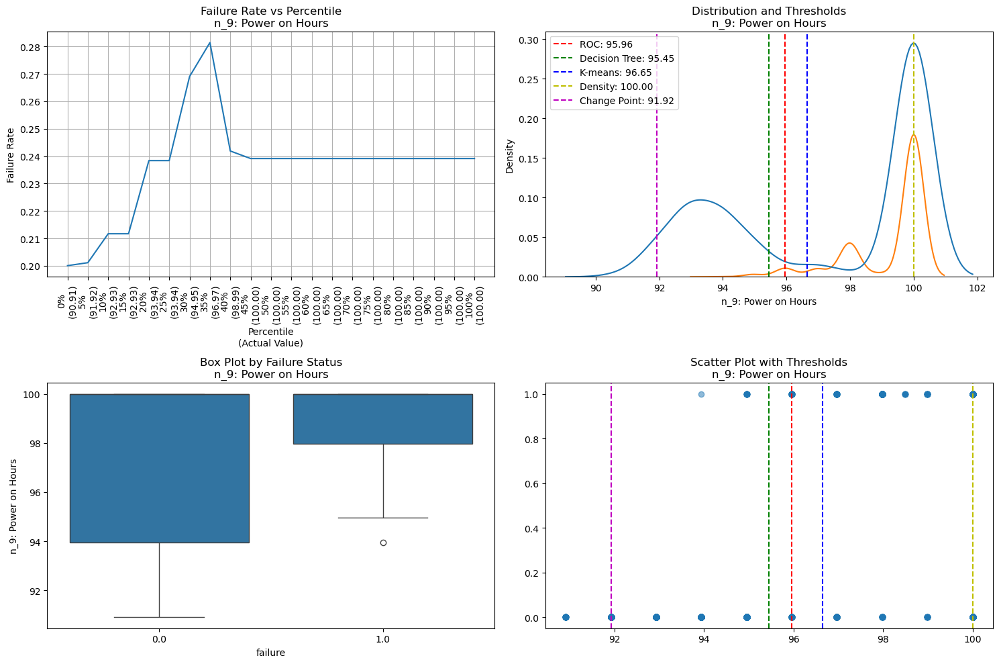


Analyzing thresholds for r_12: Power Cycle Count


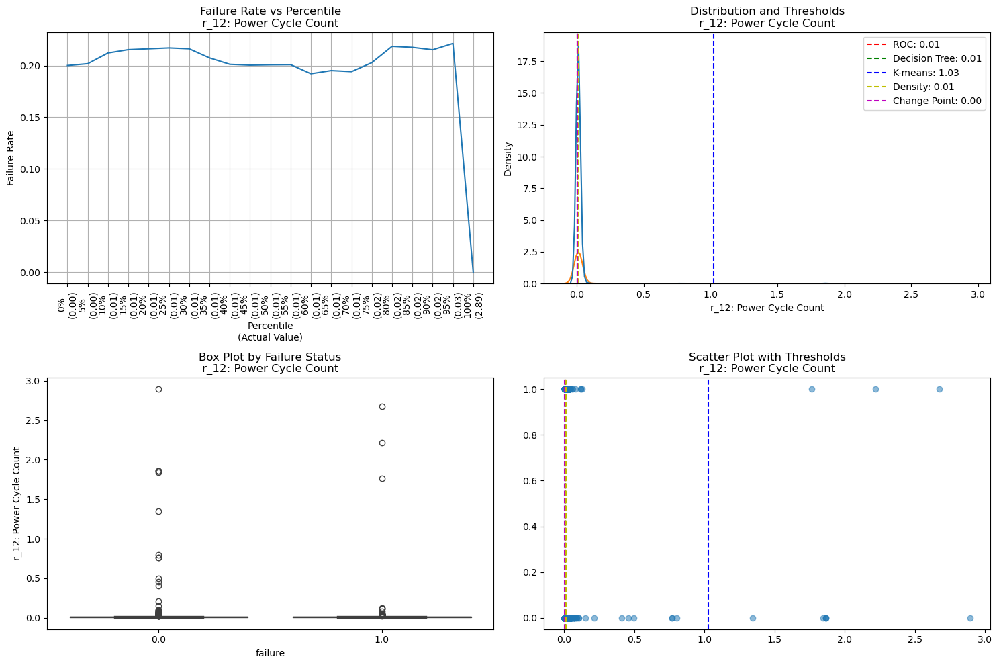


Analyzing thresholds for n_12: Power Cycle Count


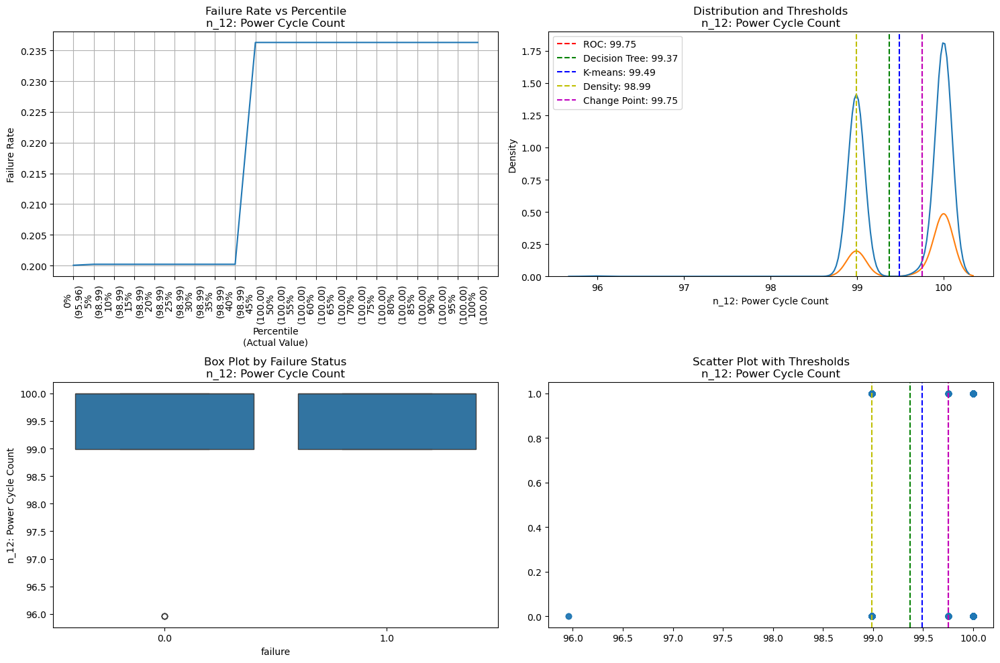


Analyzing thresholds for r_174: Unexpected Power Loss Count


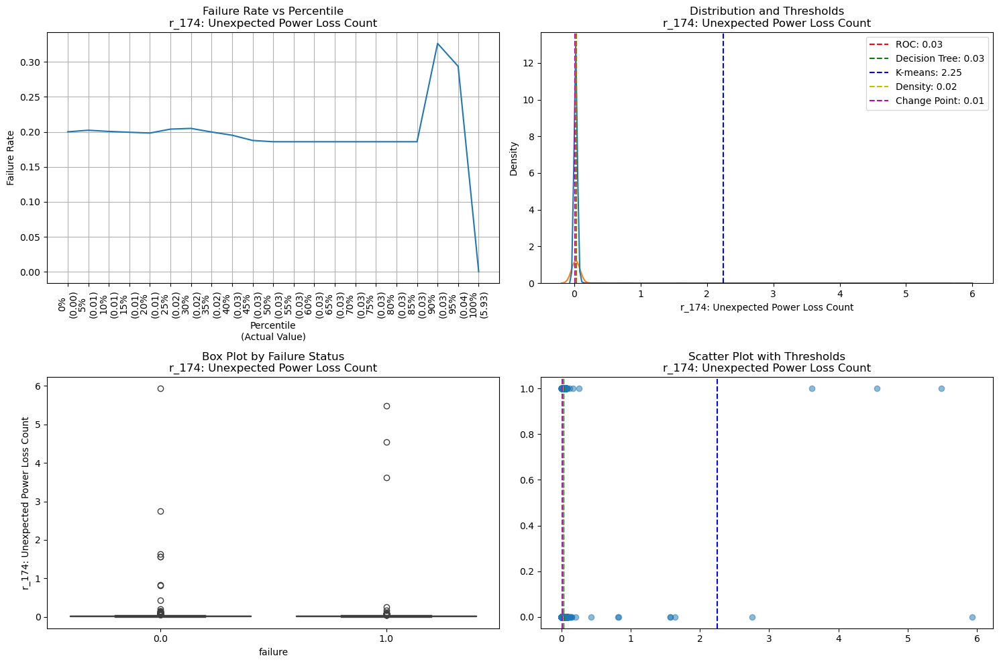


Analyzing thresholds for n_174: Unexpected Power Loss Count


/home/andre/miniconda3/envs/storage-venv/lib/python3.12/site-packages/sklearn/base.py:1473: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/home/andre/miniconda3/envs/storage-venv/lib/python3.12/site-packages/kneed/knee_locator.py:225: RuntimeWarning: invalid value encountered in divide
  return (a - min(a)) / (max(a) - min(a))
/tmp/ipykernel_29357/689890681.py:94: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=column, hue='failure')


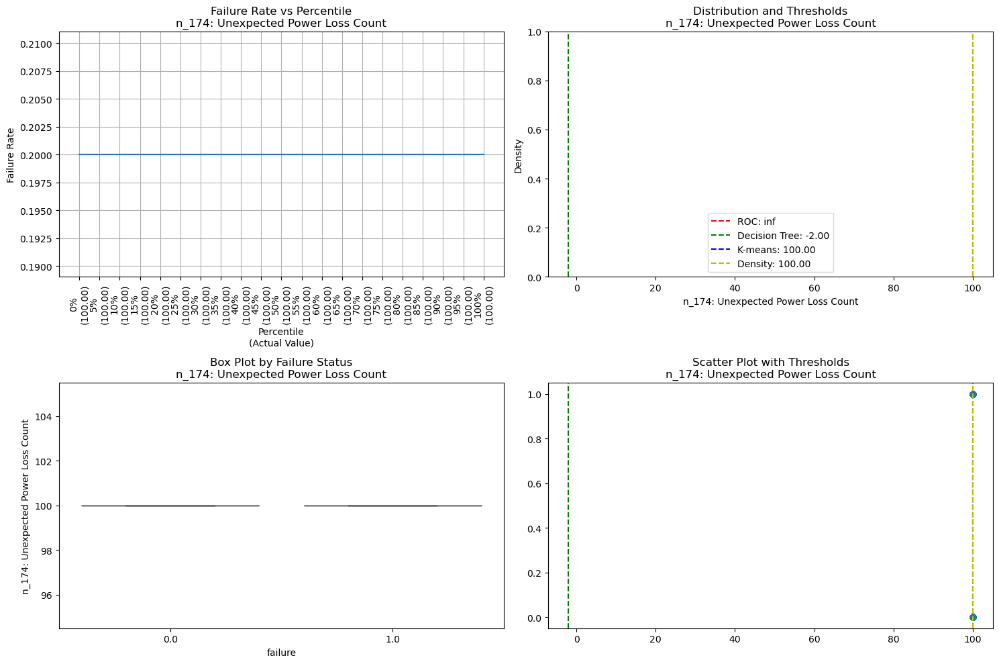


Threshold Analysis Results:
                                  Column  ROC_Threshold  \
0          r_5: Reallocated Sector Count       0.011024   
1          n_5: Reallocated Sector Count            inf   
2            r_183: SATA Downshift Error       0.000246   
3            n_183: SATA Downshift Error            inf   
4               r_184: End-to-End Errors       0.000224   
5               n_184: End-to-End Errors            inf   
6   r_187: Reported Uncorrectable Errors       0.000011   
7   n_187: Reported Uncorrectable Errors            inf   
8          r_195: Hardware ECC Recovered       1.010559   
9          n_195: Hardware ECC Recovered            inf   
10   r_197: Current Pending Sector Count       0.094787   
11   n_197: Current Pending Sector Count            inf   
12      r_199: Ultra DMA CRC Error Count       0.000388   
13      n_199: Ultra DMA CRC Error Count            inf   
14           r_171: Program Failed Count       0.008089   
15           n_171: Program

In [26]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
from kneed import KneeLocator

def calculate_thresholds_percentile(df, column, percentiles=range(0, 101, 5)):
    thresholds = np.percentile(df[column], percentiles)
    failure_rates = []
    for threshold in thresholds:
        subset = df[df[column] >= threshold]
        failure_rate = subset['failure'].mean() if len(subset) > 0 else 0
        failure_rates.append(failure_rate)
    return pd.DataFrame({
        'Percentile': percentiles,
        'Threshold': thresholds,
        'Failure_Rate': failure_rates
    })

def find_optimal_threshold_roc(df, column):
    fpr, tpr, thresholds = roc_curve(df['failure'], df[column])
    optimal_idx = np.argmax(tpr - fpr)
    return thresholds[optimal_idx]

def calculate_threshold_decision_tree(df, column):
    X = df[[column]]
    y = df['failure']
    dt = DecisionTreeClassifier(max_depth=1)
    dt.fit(X, y)
    return dt.tree_.threshold[0]

def find_threshold_kmeans(df, column):
    from sklearn.cluster import KMeans
    X = df[[column]].values
    kmeans = KMeans(n_clusters=2, random_state=42)
    kmeans.fit(X)
    return np.mean(kmeans.cluster_centers_)

def find_threshold_density_based(df, column):
    failed_values = df[df['failure'] == 1][column]
    healthy_values = df[df['failure'] == 0][column]
    kde_failed = gaussian_kde(failed_values)
    kde_healthy = gaussian_kde(healthy_values)
    x_eval = np.linspace(df[column].min(), df[column].max(), 1000)
    diff = kde_failed(x_eval) - kde_healthy(x_eval)
    threshold_idx = np.argmax(np.abs(diff))
    return x_eval[threshold_idx]

def find_threshold_change_point(df, column):
    sorted_data = df.sort_values(column)
    window_size = len(df) // 20
    rolling_failure = sorted_data['failure'].rolling(window=window_size).mean()
    x = np.array(sorted_data[column])
    y = np.array(rolling_failure)
    mask = ~np.isnan(y)
    x = x[mask]
    y = y[mask]
    try:
        kneedle = KneeLocator(x, y, S=1.0, curve='concave', direction='increasing')
        return kneedle.knee
    except:
        return None

def analyze_thresholds(df):
    numerical_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    numerical_cols.remove('failure')
    results = []
    for column in numerical_cols:
        print(f"\nAnalyzing thresholds for {column}")
        percentile_analysis = calculate_thresholds_percentile(df, column)
        roc_threshold = find_optimal_threshold_roc(df, column)
        dt_threshold = calculate_threshold_decision_tree(df, column)
        kmeans_threshold = find_threshold_kmeans(df, column)
        density_threshold = find_threshold_density_based(df, column)
        change_point = find_threshold_change_point(df, column)
        plt.figure(figsize=(15, 10))
        plt.subplot(2, 2, 1)
        plt.plot(percentile_analysis['Percentile'], percentile_analysis['Failure_Rate'])
        plt.title(f'Failure Rate vs Percentile\n{column}')
        tick_positions = percentile_analysis['Percentile']
        tick_labels = [f'{p}%\n({v:.2f})' for p, v in zip(
            percentile_analysis['Percentile'],
            percentile_analysis['Threshold']
        )]
        plt.xticks(tick_positions, tick_labels, rotation=90)
        plt.xlabel('Percentile\n(Actual Value)')
        plt.ylabel('Failure Rate')
        plt.grid(True)
        plt.subplot(2, 2, 2)
        sns.kdeplot(data=df, x=column, hue='failure')
        thresholds = [roc_threshold, dt_threshold, kmeans_threshold, density_threshold, change_point]
        threshold_names = ['ROC', 'Decision Tree', 'K-means', 'Density', 'Change Point']
        colors = ['r', 'g', 'b', 'y', 'm']
        for threshold, name, color in zip(thresholds, threshold_names, colors):
            if threshold is not None:
                plt.axvline(x=threshold, color=color, linestyle='--', label=f'{name}: {threshold:.2f}')
        plt.title(f'Distribution and Thresholds\n{column}')
        plt.legend()
        plt.subplot(2, 2, 3)
        sns.boxplot(x='failure', y=column, data=df)
        plt.title(f'Box Plot by Failure Status\n{column}')
        plt.subplot(2, 2, 4)
        plt.scatter(df[column], df['failure'], alpha=0.5)
        for threshold, color in zip(thresholds, colors):
            if threshold is not None:
                plt.axvline(x=threshold, color=color, linestyle='--')
        plt.title(f'Scatter Plot with Thresholds\n{column}')
        plt.tight_layout()
        plt.show()
        results.append({
            'Column': column,
            'ROC_Threshold': roc_threshold,
            'DecisionTree_Threshold': dt_threshold,
            'KMeans_Threshold': kmeans_threshold,
            'Density_Threshold': density_threshold,
            'ChangePoint_Threshold': change_point,
            'Failure_Rate_at_ROC': df[df[column] >= roc_threshold]['failure'].mean() if roc_threshold is not None else None
        })
    results_df = pd.DataFrame(results)
    print("\nThreshold Analysis Results:")
    print(results_df)
    return results_df
    results_df = pd.DataFrame(results)
    print("\nThreshold Analysis Results:")
    print(results_df)
    return results_df

results = analyze_thresholds(df)
results.to_csv('threshold_analysis_results.csv', index=False)

r_5: Reallocated Sector Count           float64
n_5: Reallocated Sector Count           float64
r_183: SATA Downshift Error             float64
n_183: SATA Downshift Error             float64
r_184: End-to-End Errors                float64
n_184: End-to-End Errors                float64
r_187: Reported Uncorrectable Errors    float64
n_187: Reported Uncorrectable Errors    float64
r_195: Hardware ECC Recovered           float64
n_195: Hardware ECC Recovered           float64
r_197: Current Pending Sector Count     float64
n_197: Current Pending Sector Count     float64
r_199: Ultra DMA CRC Error Count        float64
n_199: Ultra DMA CRC Error Count        float64
r_171: Program Failed Count             float64
n_171: Program Failed Count             float64
r_172: Erase Failed Count               float64
n_172: Erase Failed Count               float64
n_170: Available Reserved Blocks        float64
n_233: Media Wearout Indicator          float64
r_241: Number of Blocks Written         

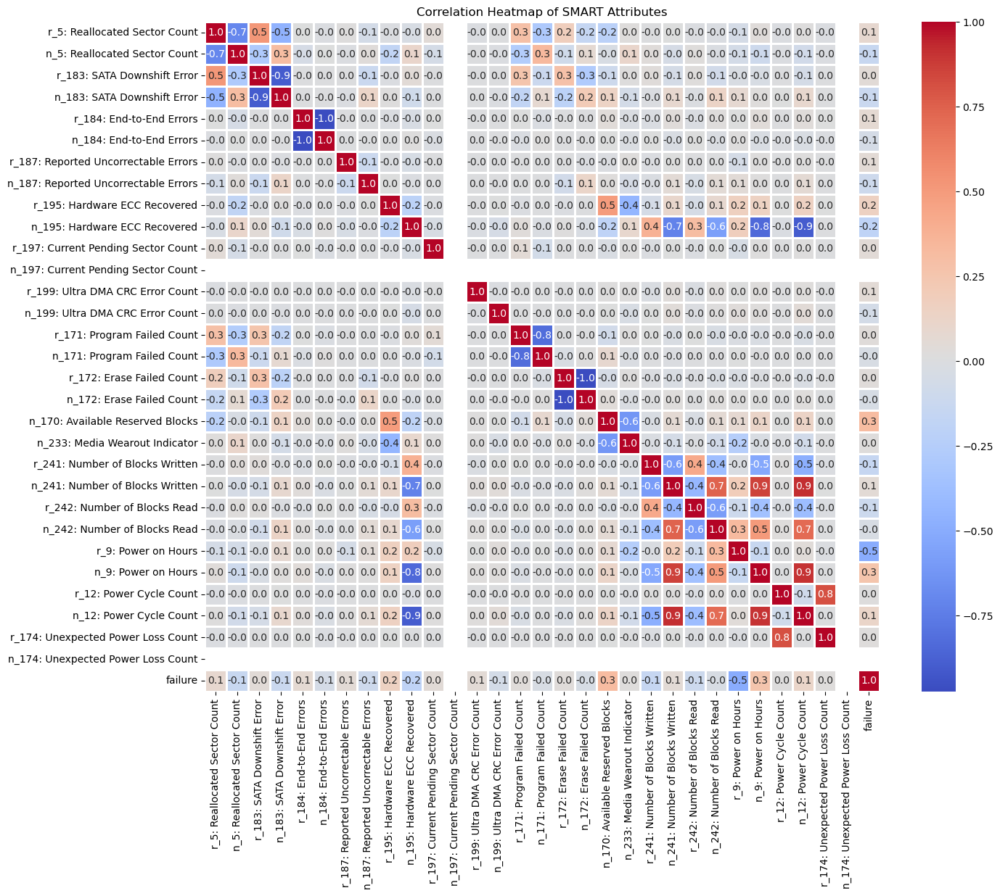

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


file_path = 'project1_dataset.xlsx'
df = pd.read_excel(file_path)
df = df.sample(frac=1.0, random_state=42).reset_index(drop=True)


column_mapping = {
    'r_5': 'r_5: Reallocated Sector Count',
    'n_5': 'n_5: Reallocated Sector Count',
    'r_183': 'r_183: SATA Downshift Error',
    'n_183': 'n_183: SATA Downshift Error',
    'r_184': 'r_184: End-to-End Errors',
    'n_184': 'n_184: End-to-End Errors',
    'r_187': 'r_187: Reported Uncorrectable Errors',
    'n_187': 'n_187: Reported Uncorrectable Errors',
    'r_195': 'r_195: Hardware ECC Recovered',
    'n_195': 'n_195: Hardware ECC Recovered',
    'r_197': 'r_197: Current Pending Sector Count',
    'n_197': 'n_197: Current Pending Sector Count',
    'r_199': 'r_199: Ultra DMA CRC Error Count',
    'n_199': 'n_199: Ultra DMA CRC Error Count',
    'r_171': 'r_171: Program Failed Count',
    'n_171': 'n_171: Program Failed Count',
    'r_172': 'r_172: Erase Failed Count',
    'n_172': 'n_172: Erase Failed Count',
    'n_170': 'n_170: Available Reserved Blocks',
    'n_233': 'n_233: Media Wearout Indicator',
    'r_241': 'r_241: Number of Blocks Written',
    'n_241': 'n_241: Number of Blocks Written',
    'r_242': 'r_242: Number of Blocks Read',
    'n_242': 'n_242: Number of Blocks Read',
    'r_9': 'r_9: Power on Hours',
    'n_9': 'n_9: Power on Hours',
    'r_12': 'r_12: Power Cycle Count',
    'n_12': 'n_12: Power Cycle Count',
    'r_174': 'r_174: Unexpected Power Loss Count',
    'n_174': 'n_174: Unexpected Power Loss Count',
    'failure': 'failure'
}
df.rename(columns=column_mapping, inplace=True)


df = df.astype('float64', errors='ignore')
print(df.dtypes)


correlation_matrix = df.corr(method='pearson')

plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", cbar=True, linewidths=1, fmt='.1f')
plt.title("Correlation Heatmap of SMART Attributes")
plt.show()


## Part 3

Columns after renaming:
['r_5: Reallocated Sector Count', 'n_5: Reallocated Sector Count', 'r_183: SATA Downshift Error', 'n_183: SATA Downshift Error', 'r_184: End-to-End Errors', 'n_184: End-to-End Errors', 'r_187: Reported Uncorrectable Errors', 'n_187: Reported Uncorrectable Errors', 'r_195: Hardware ECC Recovered', 'n_195: Hardware ECC Recovered', 'r_197: Current Pending Sector Count', 'n_197: Current Pending Sector Count', 'r_199: Ultra DMA CRC Error Count', 'n_199: Ultra DMA CRC Error Count', 'r_171: Program Failed Count', 'n_171: Program Failed Count', 'r_172: Erase Failed Count', 'n_172: Erase Failed Count', 'n_170: Available Reserved Blocks', 'n_233: Media Wearout Indicator', 'r_241: Number of Blocks Written', 'n_241: Number of Blocks Written', 'r_242: Number of Blocks Read', 'n_242: Number of Blocks Read', 'r_9: Power on Hours', 'n_9: Power on Hours', 'r_12: Power Cycle Count', 'n_12: Power Cycle Count', 'r_174: Unexpected Power Loss Count', 'n_174: Unexpected Power Loss Cou

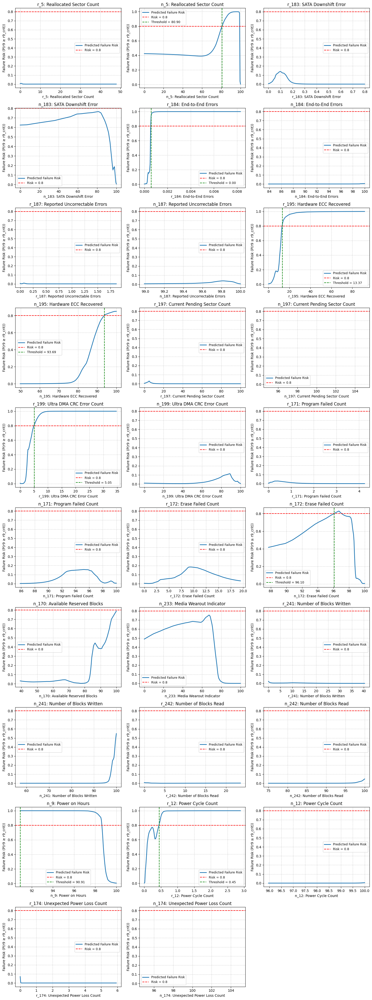


Computed Thresholds (original scale) for each feature (risk target: 0.8):
  r_5: Reallocated Sector Count: No threshold found (risk did not reach 80%)
  n_5: Reallocated Sector Count: 80.90
  r_183: SATA Downshift Error: No threshold found (risk did not reach 80%)
  n_183: SATA Downshift Error: No threshold found (risk did not reach 80%)
  r_184: End-to-End Errors: 0.00
  n_184: End-to-End Errors: No threshold found (risk did not reach 80%)
  r_187: Reported Uncorrectable Errors: No threshold found (risk did not reach 80%)
  n_187: Reported Uncorrectable Errors: No threshold found (risk did not reach 80%)
  r_195: Hardware ECC Recovered: 13.37
  n_195: Hardware ECC Recovered: 93.69
  r_197: Current Pending Sector Count: No threshold found (risk did not reach 80%)
  n_197: Current Pending Sector Count: No threshold found (risk did not reach 80%)
  r_199: Ultra DMA CRC Error Count: 5.05
  n_199: Ultra DMA CRC Error Count: No threshold found (risk did not reach 80%)
  r_171: Program Fail

In [4]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from scipy.stats import norm

np.random.seed(42)
torch.manual_seed(42)

file_path = 'project1_dataset.xlsx'
if not os.path.exists(file_path):
    raise FileNotFoundError(f"Dataset file not found at {file_path}")

df = pd.read_excel(file_path)

column_mapping = {
    'r_5': 'r_5: Reallocated Sector Count',
    'n_5': 'n_5: Reallocated Sector Count',
    'r_183': 'r_183: SATA Downshift Error',
    'n_183': 'n_183: SATA Downshift Error',
    'r_184': 'r_184: End-to-End Errors',
    'n_184': 'n_184: End-to-End Errors',
    'r_187': 'r_187: Reported Uncorrectable Errors',
    'n_187': 'n_187: Reported Uncorrectable Errors',
    'r_195': 'r_195: Hardware ECC Recovered',
    'n_195': 'n_195: Hardware ECC Recovered',
    'r_197': 'r_197: Current Pending Sector Count',
    'n_197': 'n_197: Current Pending Sector Count',
    'r_199': 'r_199: Ultra DMA CRC Error Count',
    'n_199': 'n_199: Ultra DMA CRC Error Count',
    'r_171': 'r_171: Program Failed Count',
    'n_171': 'n_171: Program Failed Count',
    'r_172': 'r_172: Erase Failed Count',
    'n_172': 'n_172: Erase Failed Count',
    'n_170': 'n_170: Available Reserved Blocks',
    'n_233': 'n_233: Media Wearout Indicator',
    'r_241': 'r_241: Number of Blocks Written',
    'n_241': 'n_241: Number of Blocks Written',
    'r_242': 'r_242: Number of Blocks Read',
    'n_242': 'n_242: Number of Blocks Read',
    'r_9': 'r_9: Power on Hours',
    'n_9': 'n_9: Power on Hours',
    'r_12': 'r_12: Power Cycle Count',
    'n_12': 'n_12: Power Cycle Count',
    'r_174': 'r_174: Unexpected Power Loss Count',
    'n_174': 'n_174: Unexpected Power Loss Count',
    'failure': 'failure'
}

df.rename(columns=column_mapping, inplace=True)
df.columns = df.columns.str.strip()

print("Columns after renaming:")
print(df.columns.tolist())

target_column = 'r_9: Power on Hours'
if target_column not in df.columns:
    raise KeyError(f"Target column '{target_column}' not found in DataFrame.")

feature_columns = [col for col in df.columns if col not in [target_column, 'failure']]
print("\nInput features:")
print(feature_columns)

X_df = df[feature_columns]
y_df = df[target_column]
failure_flags = df['failure'].values.astype(np.int32)

X_data = X_df.values.astype(np.float32)
y_data = y_df.values.reshape(-1, 1).astype(np.float32)

scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_scaled = scaler_X.fit_transform(X_data)
y_scaled = scaler_y.fit_transform(y_data)

X_train, X_test, y_train, y_test, fail_train, fail_test = train_test_split(
    X_scaled, y_scaled, failure_flags, test_size=0.2, random_state=42)

input_dim = X_train.shape[1]

num_mixtures = 3

class MDN(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_mixtures, dropout_prob=0.2):
        super(MDN, self).__init__()
        self.num_mixtures = num_mixtures
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.dropout = nn.Dropout(dropout_prob)
        self.fc3 = nn.Linear(hidden_dim, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, num_mixtures * 3)
        self.relu = nn.ReLU()
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.dropout(x)
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        return x

hidden_dim = 64
model = MDN(input_dim, hidden_dim, num_mixtures, dropout_prob=0.2)

def mdn_loss(y_pred, y, num_mixtures):
    pi = y_pred[:, :num_mixtures]
    mu = y_pred[:, num_mixtures:2*num_mixtures]
    sigma = y_pred[:, 2*num_mixtures:3*num_mixtures]
    pi = torch.softmax(pi, dim=1)
    sigma = torch.nn.functional.softplus(sigma) + 1e-6
    y_expanded = y.expand_as(mu)
    constant = np.sqrt(2 * np.pi)
    prob = 1.0 / (sigma * constant) * torch.exp(-0.5 * ((y_expanded - mu)/sigma)**2)
    weighted_prob = pi * prob
    total_prob = torch.sum(weighted_prob, dim=1, keepdim=True)
    loss = -torch.log(total_prob + 1e-8)
    return torch.mean(loss)

num_epochs = 300
batch_size = 32
optimizer = optim.Adam(model.parameters(), lr=0.001)

X_train_tensor = torch.from_numpy(X_train)
y_train_tensor = torch.from_numpy(y_train)

model.train()
for epoch in range(num_epochs):
    permutation = torch.randperm(X_train_tensor.size(0))
    epoch_loss = 0.0
    for i in range(0, X_train_tensor.size(0), batch_size):
        indices = permutation[i:i+batch_size]
        batch_x = X_train_tensor[indices]
        batch_y = y_train_tensor[indices]
        optimizer.zero_grad()
        outputs = model(batch_x)
        loss = mdn_loss(outputs, batch_y, num_mixtures)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    if (epoch + 1) % 50 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

def mdn_parameters(X_np):
    model.eval()
    with torch.no_grad():
        X_tensor = torch.from_numpy(X_np.astype(np.float32))
        out = model(X_tensor).numpy()
    pi_vals = out[:, :num_mixtures]
    mu_vals = out[:, num_mixtures:2*num_mixtures]
    sigma_vals = out[:, 2*num_mixtures:3*num_mixtures]
    exp_pi = np.exp(pi_vals - np.max(pi_vals, axis=1, keepdims=True))
    pi_vals = exp_pi / np.sum(exp_pi, axis=1, keepdims=True)
    sigma_vals = np.log1p(np.exp(sigma_vals)) + 1e-6
    return pi_vals, mu_vals, sigma_vals

def risk_function_density(X_np, r9_crit):
    pi_vals, mu_vals, sigma_vals = mdn_parameters(X_np)
    tail_probs = 1 - norm.cdf(r9_crit, loc=mu_vals, scale=sigma_vals)
    risk = np.sum(pi_vals * tail_probs, axis=1)
    return risk

fail_train_indices = np.where(fail_train == 1)[0]
if len(fail_train_indices) == 0:
    raise ValueError("No failure cases found in the training set to compute r9_crit.")
y_train_original = scaler_y.inverse_transform(y_train)
r9_fail_train = y_train_original[fail_train_indices]
r9_crit = np.median(r9_fail_train)
print("Critical power-on hours (r9_crit) from failed drives (median):", r9_crit)

def find_threshold_for_feature_density(feature_name, risk_threshold=0.80, grid_points=200):
    try:
        feat_index = feature_columns.index(feature_name)
    except ValueError:
        raise ValueError(f"Feature '{feature_name}' not found in feature columns.")
    baseline = np.median(X_train, axis=0)
    feature_values = X_train[:, feat_index]
    grid_scaled = np.linspace(np.min(feature_values), np.max(feature_values), grid_points)
    risk_vals = []
    for val in grid_scaled:
        candidate = baseline.copy()
        candidate[feat_index] = val
        candidate = candidate.reshape(1, -1)
        risk = risk_function_density(candidate, r9_crit)[0]
        risk_vals.append(risk)
    risk_vals = np.array(risk_vals)
    indices = np.where(risk_vals >= risk_threshold)[0]
    if indices.size > 0:
        threshold_scaled = grid_scaled[indices[0]]
        threshold_original = threshold_scaled * scaler_X.scale_[feat_index] + scaler_X.mean_[feat_index]
    else:
        threshold_original = None
    grid_original = grid_scaled * scaler_X.scale_[feat_index] + scaler_X.mean_[feat_index]
    return threshold_original, grid_original, risk_vals

risk_target = 0.80
thresholds = {}

n_features = len(feature_columns)
n_cols = 3
n_rows = math.ceil(n_features / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
axes = axes.flatten()

for i, feat in enumerate(feature_columns):
    ax = axes[i]
    thr, grid_orig, risk_curve = find_threshold_for_feature_density(feat, risk_threshold=risk_target, grid_points=200)
    thresholds[feat] = thr
    ax.plot(grid_orig, risk_curve, lw=2, label="Predicted Failure Risk")
    ax.axhline(risk_target, color='red', linestyle='--', lw=1.5, label=f"Risk = {risk_target}")
    if thr is not None:
        ax.axvline(thr, color='green', linestyle='--', lw=1.5, label=f"Threshold = {thr:.2f}")
    ax.set_title(feat)
    ax.set_xlabel(feat)
    ax.set_ylabel("Failure Risk (P(r9 ≥ r9_crit))")
    ax.legend(fontsize=9)
    ax.grid(True, linestyle='--', alpha=0.6)

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])
    
fig.tight_layout()
plt.show()

print("\nComputed Thresholds (original scale) for each feature (risk target: {}):".format(risk_target))
for feat, thr in thresholds.items():
    if thr is not None:
        print(f"  {feat}: {thr:.2f}")
    else:
        print(f"  {feat}: No threshold found (risk did not reach {risk_target*100:.0f}%)")

## Part 4

c:\Users\Sahand\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Columns after renaming:
['r_5: Reallocated Sector Count', 'n_5: Reallocated Sector Count', 'r_183: SATA Downshift Error', 'n_183: SATA Downshift Error', 'r_184: End-to-End Errors', 'n_184: End-to-End Errors', 'r_187: Reported Uncorrectable Errors', 'n_187: Reported Uncorrectable Errors', 'r_195: Hardware ECC Recovered', 'n_195: Hardware ECC Recovered', 'r_197: Current Pending Sector Count', 'n_197: Current Pending Sector Count', 'r_199: Ultra DMA CRC Error Count', 'n_199: Ultra DMA CRC Error Count', 'r_171: Program Failed Count', 'n_171: Program Failed Count', 'r_172: Erase Failed Count', 'n_172: Erase Failed Count', 'n_170: Available Reserved Blocks', 'n_233: Media Wearout Indicator', 'r_241: Number of Blocks Written', 'n_241: Number of Blocks Written', 'r_242: Number of Blocks Read', 'n_242: Number of Blocks Read', 'r_9: Power on Hours', 'n_9: Power on Hours', 'r_12: Power Cycle Count', 'n_12: Power Cycle Count', 'r_174: Unexpected Power Loss Count', 'n_174: Unexpected Power Loss Cou

  0%|          | 43/1000000 [00:02<15:00:44, 18.50it/s]



Learned Bayesian Network edges:
[('r_195: Hardware ECC Recovered', 'n_174: Unexpected Power Loss Count'), ('n_195: Hardware ECC Recovered', 'n_174: Unexpected Power Loss Count'), ('n_197: Current Pending Sector Count', 'r_9: Power on Hours'), ('n_197: Current Pending Sector Count', 'n_241: Number of Blocks Written'), ('n_197: Current Pending Sector Count', 'r_241: Number of Blocks Written'), ('n_197: Current Pending Sector Count', 'n_195: Hardware ECC Recovered'), ('n_197: Current Pending Sector Count', 'n_171: Program Failed Count'), ('n_197: Current Pending Sector Count', 'n_233: Media Wearout Indicator'), ('n_197: Current Pending Sector Count', 'r_195: Hardware ECC Recovered'), ('n_197: Current Pending Sector Count', 'r_171: Program Failed Count'), ('n_197: Current Pending Sector Count', 'r_12: Power Cycle Count'), ('n_197: Current Pending Sector Count', 'r_242: Number of Blocks Read'), ('n_197: Current Pending Sector Count', 'r_174: Unexpected Power Loss Count'), ('n_197: Current 

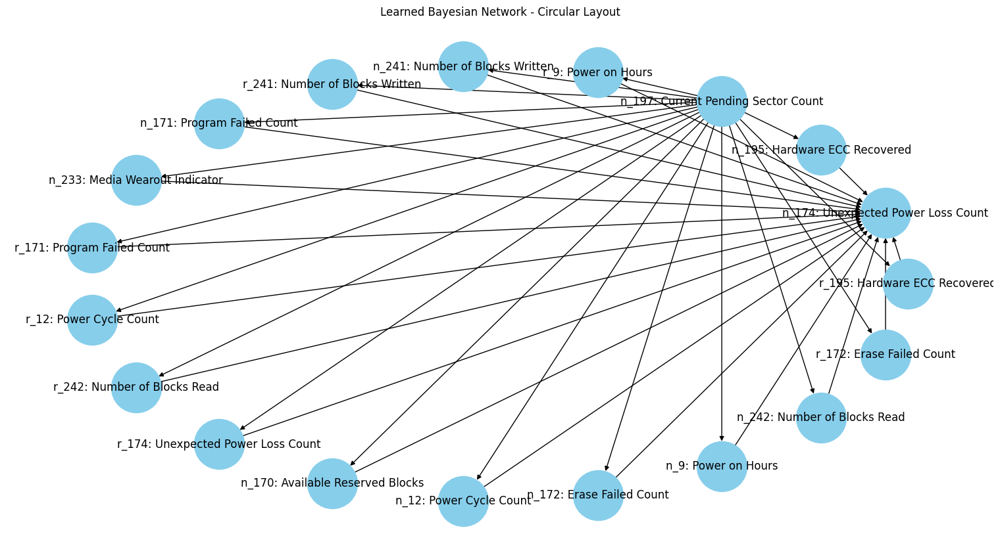

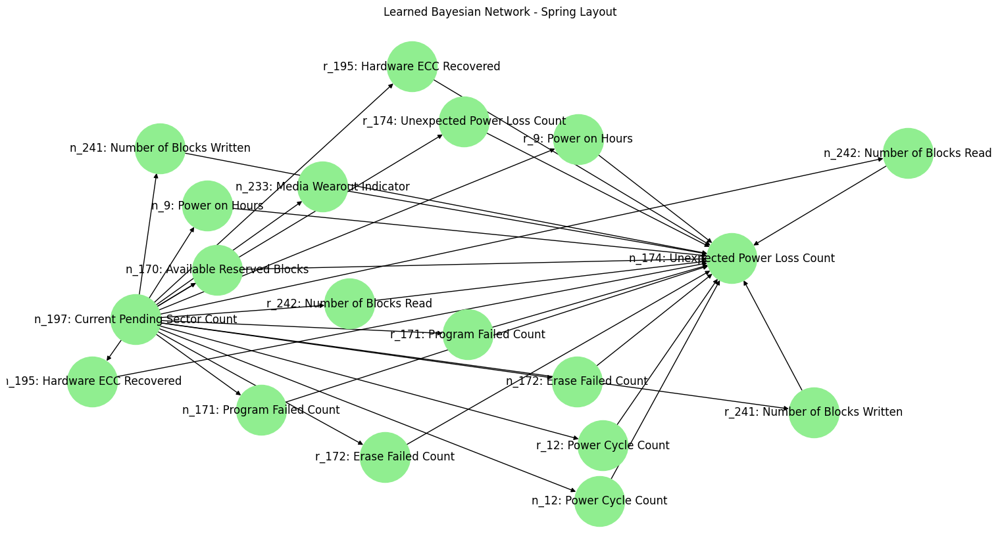


Mutual Information Values for first set:
('n_170: Available Reserved Blocks', 'n_241: Number of Blocks Written'): -0.444
('n_241: Number of Blocks Written', 'n_195: Hardware ECC Recovered'): -0.671
('n_241: Number of Blocks Written', 'n_242: Number of Blocks Read'): -0.607
('n_241: Number of Blocks Written', 'n_187: Reported Uncorrectable Errors'): -0.000
('n_242: Number of Blocks Read', 'n_233: Media Wearout Indicator'): -0.106
('n_242: Number of Blocks Read', 'r_5: Reallocated Sector Count'): -0.000
('n_187: Reported Uncorrectable Errors', 'n_195: Hardware ECC Recovered'): -0.000

Mutual Information Values for alternate set:
('r_5: Reallocated Sector Count', 'n_5: Reallocated Sector Count'): -0.000
('r_183: SATA Downshift Error', 'n_183: SATA Downshift Error'): -0.000
('r_9: Power on Hours', 'r_12: Power Cycle Count'): -0.014
('r_187: Reported Uncorrectable Errors', 'n_187: Reported Uncorrectable Errors'): -0.000
('r_172: Erase Failed Count', 'n_172: Erase Failed Count'): -0.000
('n

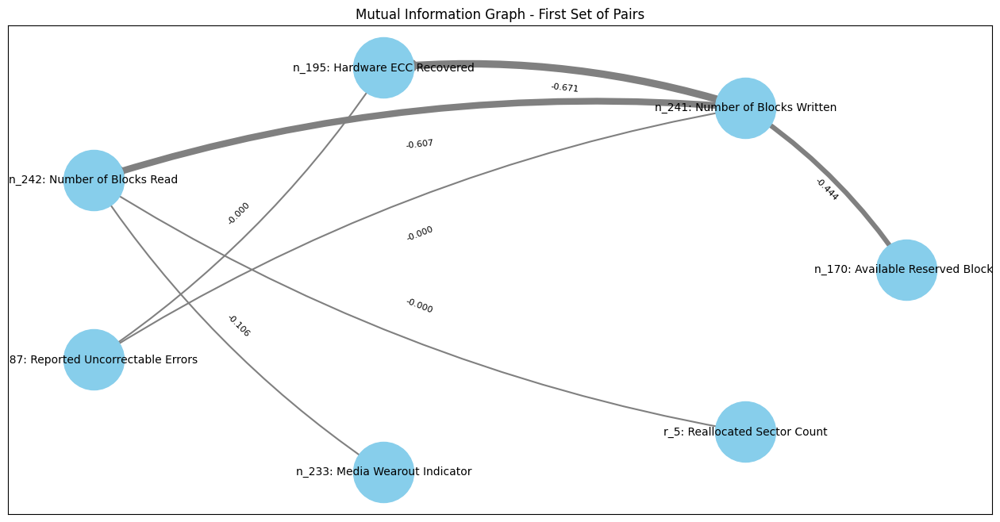

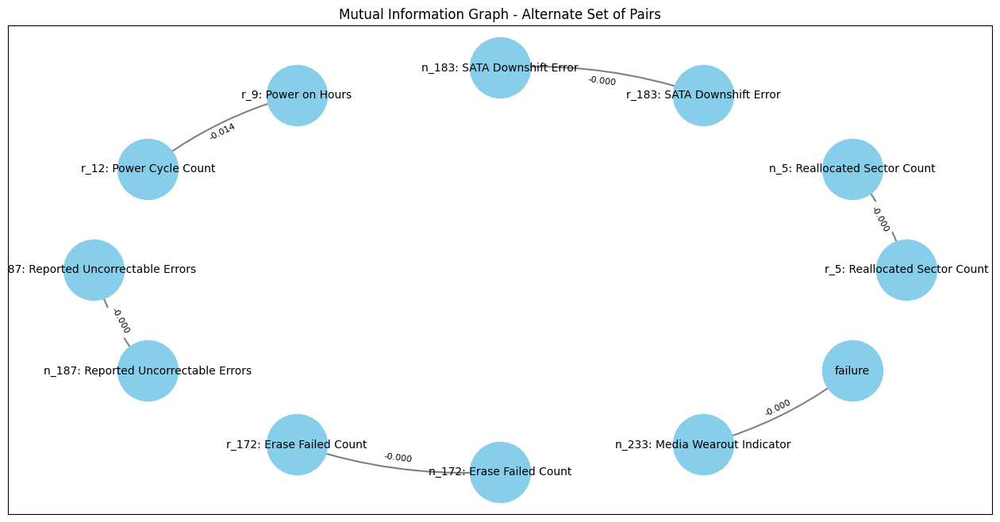

In [2]:
import os
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from pgmpy.estimators import HillClimbSearch, BicScore
from pgmpy.models import BayesianModel
from sklearn.metrics import mutual_info_score

file_path = 'project1_dataset.xlsx'
if not os.path.exists(file_path):
    raise FileNotFoundError(f"Dataset file not found at {file_path}")

data = pd.read_excel(file_path)

column_mapping = {
    'r_5': 'r_5: Reallocated Sector Count',
    'n_5': 'n_5: Reallocated Sector Count',
    'r_183': 'r_183: SATA Downshift Error',
    'n_183': 'n_183: SATA Downshift Error',
    'r_184': 'r_184: End-to-End Errors',
    'n_184': 'n_184: End-to-End Errors',
    'r_187': 'r_187: Reported Uncorrectable Errors',
    'n_187': 'n_187: Reported Uncorrectable Errors',
    'r_195': 'r_195: Hardware ECC Recovered',
    'n_195': 'n_195: Hardware ECC Recovered',
    'r_197': 'r_197: Current Pending Sector Count',
    'n_197': 'n_197: Current Pending Sector Count',
    'r_199': 'r_199: Ultra DMA CRC Error Count',
    'n_199': 'n_199: Ultra DMA CRC Error Count',
    'r_171': 'r_171: Program Failed Count',
    'n_171': 'n_171: Program Failed Count',
    'r_172': 'r_172: Erase Failed Count',
    'n_172': 'n_172: Erase Failed Count',
    'n_170': 'n_170: Available Reserved Blocks',
    'n_233': 'n_233: Media Wearout Indicator',
    'r_241': 'r_241: Number of Blocks Written',
    'n_241': 'n_241: Number of Blocks Written',
    'r_242': 'r_242: Number of Blocks Read',
    'n_242': 'n_242: Number of Blocks Read',
    'r_9': 'r_9: Power on Hours',
    'n_9': 'n_9: Power on Hours',
    'r_12': 'r_12: Power Cycle Count',
    'n_12': 'n_12: Power Cycle Count',
    'r_174': 'r_174: Unexpected Power Loss Count',
    'n_174': 'n_174: Unexpected Power Loss Count',
    'failure': 'failure'
}
data.rename(columns=column_mapping, inplace=True)
data.columns = data.columns.str.strip()

print("Columns after renaming:")
print(data.columns.tolist())

data_discrete = data.copy()
numeric_cols = data_discrete.select_dtypes(include=[np.number]).columns.tolist()

for col in numeric_cols:
    try:
        data_discrete[col] = pd.qcut(data_discrete[col], q=3, labels=False, duplicates='drop')
    except Exception as e:
        print(f"Could not discretize column '{col}': {e}")

print("\nSample of discretized data:")
print(data_discrete.head())

hc = HillClimbSearch(data_discrete)
best_model = hc.estimate(scoring_method=BicScore(data_discrete))
print("\nLearned Bayesian Network edges:")
print(best_model.edges())

model = BayesianModel(best_model.edges())

graph_bn = nx.DiGraph(list(model.edges()))
pos_circular = nx.circular_layout(graph_bn)

plt.figure(figsize=(15, 8))
nx.draw(graph_bn, pos_circular, with_labels=True, arrows=True, node_size=3000, node_color="skyblue", font_size=12)
plt.title("Learned Bayesian Network - Circular Layout")
plt.show()

pos_spring = nx.spring_layout(graph_bn, seed=42)
plt.figure(figsize=(15, 8))
nx.draw(graph_bn, pos_spring, with_labels=True, arrows=True, node_size=3000, node_color="lightgreen", font_size=12)
plt.title("Learned Bayesian Network - Spring Layout")
plt.show()

def compute_mi(selected_pairs, discrete_data):
    mi_dict = {}
    for pair in selected_pairs:
        col1, col2 = pair
        if col1 not in discrete_data.columns or col2 not in discrete_data.columns:
            print(f"Columns {col1} or {col2} not found. Skipping pair {pair}.")
            continue
        mi = mutual_info_score(discrete_data[col1], discrete_data[col2])
        mi = -mi
        mi_dict[pair] = mi
    return mi_dict

selected_pairs = [
    ('n_170: Available Reserved Blocks', 'n_241: Number of Blocks Written'),
    ('n_241: Number of Blocks Written', 'n_195: Hardware ECC Recovered'),
    ('n_241: Number of Blocks Written', 'n_242: Number of Blocks Read'),
    ('n_241: Number of Blocks Written', 'n_187: Reported Uncorrectable Errors'),
    ('n_242: Number of Blocks Read', 'n_233: Media Wearout Indicator'),
    ('n_242: Number of Blocks Read', 'r_5: Reallocated Sector Count'),
    ('n_187: Reported Uncorrectable Errors', 'n_195: Hardware ECC Recovered')
]

mi_values_1 = compute_mi(selected_pairs, data_discrete)
print("\nMutual Information Values for first set:")
for pair, mi in mi_values_1.items():
    print(f"{pair}: {mi:.3f}")

alternate_pairs = [
    ('r_5: Reallocated Sector Count', 'n_5: Reallocated Sector Count'),
    ('r_183: SATA Downshift Error', 'n_183: SATA Downshift Error'),
    ('r_9: Power on Hours', 'r_12: Power Cycle Count'),
    ('r_187: Reported Uncorrectable Errors', 'n_187: Reported Uncorrectable Errors'),
    ('r_172: Erase Failed Count', 'n_172: Erase Failed Count'),
    ('n_233: Media Wearout Indicator', 'failure')
]

mi_values_2 = compute_mi(alternate_pairs, data_discrete)
print("\nMutual Information Values for alternate set:")
for pair, mi in mi_values_2.items():
    print(f"{pair}: {mi:.3f}")

def draw_mi_graph(mi_dict, title, figsize=(16, 8)):
    G = nx.DiGraph()
    for pair, mi in mi_dict.items():
        G.add_edge(pair[0], pair[1], weight=abs(mi), mi_value=mi)
    pos = nx.circular_layout(G)
    plt.figure(figsize=figsize)
    nx.draw_networkx_nodes(G, pos, node_size=3000, node_color="skyblue")
    scale_factor = 10
    min_width = 1.5
    edges = G.edges(data=True)
    edge_widths = [max(scale_factor * d['weight'], min_width) for u, v, d in edges]
    nx.draw_networkx_edges(G, pos, edgelist=[(u, v) for u, v, d in edges],
                           connectionstyle="arc3,rad=0.1", width=edge_widths,
                           edge_color="grey", arrows=True, arrowstyle='-|>', min_target_margin=15)
    nx.draw_networkx_labels(G, pos, font_size=10, font_color="black")
    edge_labels = {(u, v): f"{d['mi_value']:.3f}" for u, v, d in edges}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)
    plt.title(title)
    plt.show()

draw_mi_graph(mi_values_1, "Mutual Information Graph - First Set of Pairs")
draw_mi_graph(mi_values_2, "Mutual Information Graph - Alternate Set of Pairs")